In [1]:
!pip install torch pandas numpy scikit-learn matplotlib seaborn tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 72.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 11.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 36.8 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5

In [2]:
import os, math, random, datetime
from collections import defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

In [ ]:
DATA_CSV = "/kaggle/input/1st-jan-2015-to-30th-sep-2025-district-data/combined_dataset.csv"
OUTPUT_DIR = "outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", DEVICE)

FEATURE_COLS = ["tp","sro","ssro","swvl1","swvl2","swvl3","t2m","d2m"]
TIME_COL = "time"
DIST_COL = "district"

PAST_SEQ = 168  
HORIZON = 24  
BATCH_SIZE = 32
LR = 1e-3
EPOCHS = 40
K_NEIGHBORS = 4 

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

def ensure_datetime(df, time_col=TIME_COL):
    df[time_col] = pd.to_datetime(df[time_col])
    return df

def date_in_range(ts, start, end):
    return (ts >= pd.to_datetime(start)) & (ts <= pd.to_datetime(end))

print("Loading CSV:", DATA_CSV)
df = pd.read_csv(DATA_CSV)
df = ensure_datetime(df, TIME_COL)
use_cols = [DIST_COL, TIME_COL] + FEATURE_COLS
df = df[use_cols].drop_duplicates(subset=[DIST_COL, TIME_COL])
print("Loaded rows:", len(df), "unique districts:", df[DIST_COL].nunique())

districts = sorted(df[DIST_COL].unique())
district_to_idx = {d:i for i,d in enumerate(districts)}
num_nodes = len(districts)
print("num_nodes:", num_nodes)

min_time = df[TIME_COL].min().floor('H')
max_time = df[TIME_COL].max().ceil('H')
print("Time range:", min_time, "to", max_time)

full_time_index = pd.date_range(start=min_time, end=max_time, freq='H')

Using device: cuda
Loading CSV: /kaggle/input/1st-jan-2015-to-30th-sep-2025-district-data/combined_dataset.csv
Loaded rows: 1121748 unique districts: 12
num_nodes: 12
Time range: 2015-01-01 00:00:00 to 2025-09-30 23:00:00


/tmp/ipykernel_37/3741091909.py:57: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  min_time = df[TIME_COL].min().floor('H')
/tmp/ipykernel_37/3741091909.py:58: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  max_time = df[TIME_COL].max().ceil('H')
/tmp/ipykernel_37/3741091909.py:61: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  full_time_index = pd.date_range(start=min_time, end=max_time, freq='H')


In [ ]:

panel = {}
for d in tqdm(districts, desc="Building district panels"):
    sub = df[df[DIST_COL]==d].set_index(TIME_COL).reindex(full_time_index)
    sub_interp = sub[FEATURE_COLS].astype(float).interpolate(method='time', limit_direction='both')
    sub_interp = sub_interp.fillna(method='ffill').fillna(method='bfill').fillna(0.0)
    panel[d] = sub_interp

T = len(full_time_index)
F = len(FEATURE_COLS)
data_array = np.zeros((num_nodes, T, F), dtype=np.float32)
for i,d in enumerate(districts):
    data_array[i] = panel[d].values

print("Data array shape:", data_array.shape)  
train_end = pd.to_datetime("2025-07-31 23:00:00")
val_start = pd.to_datetime("2025-08-01 00:00:00")
val_end = pd.to_datetime("2025-09-30 23:00:00")

train_mask = (full_time_index <= train_end)
val_mask = (full_time_index >= val_start) & (full_time_index <= val_end)
print("Train hours:", train_mask.sum(), "Val hours:", val_mask.sum())

scaler = StandardScaler()
train_data_for_scaler = data_array[:, train_mask, :].reshape(-1, F)
print("Fitting scaler on shape:", train_data_for_scaler.shape)
scaler.fit(train_data_for_scaler)
# apply
data_scaled = np.zeros_like(data_array)
for i in range(num_nodes):
    data_scaled[i] = scaler.transform(data_array[i])

print("Building adjacency matrix via correlation-based kNN (K=", K_NEIGHBORS, ")")
agg_series = data_array.mean(axis=2)
agg_train = agg_series[:, train_mask]

corr = np.corrcoef(agg_train) 
corr = np.nan_to_num(corr)
A = np.zeros((num_nodes, num_nodes), dtype=np.float32)
for i in range(num_nodes):
    neighbors = np.argsort(-corr[i]) 
    cnt = 0
    for j in neighbors:
        if i==j: continue
        A[i,j] = max(0.0, corr[i,j])
        cnt += 1
        if cnt >= K_NEIGHBORS: break
A = (A + A.T) / 2.0
row_sum = A.sum(axis=1, keepdims=True) + 1e-6
A = A / row_sum

print("Adjacency built. Sample row sums (should be ~1):", A.sum(axis=1)[:5])

plt.figure(figsize=(8,6))
sns.heatmap(A, cmap="viridis")
plt.title("Adjacency matrix (correlation kNN)")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "adjacency_heatmap.png"))
plt.close()

Building district panels:   0%|          | 0/12 [00:00<?, ?it/s]/tmp/ipykernel_37/2225450301.py:8: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  sub_interp = sub_interp.fillna(method='ffill').fillna(method='bfill').fillna(0.0)
Building district panels:   8%|▊         | 1/12 [00:00<00:01,  7.33it/s]/tmp/ipykernel_37/2225450301.py:8: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  sub_interp = sub_interp.fillna(method='ffill').fillna(method='bfill').fillna(0.0)
Building district panels:  17%|█▋        | 2/12 [00:00<00:01,  7.40it/s]/tmp/ipykernel_37/2225450301.py:8: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  sub_interp = sub_interp.fillna(method='ffill').fillna(method='bfill').fillna(0.0)
Building district panels:  

Data array shape: (12, 94224, 8)
Train hours: 92760 Val hours: 1464
Fitting scaler on shape: (1113120, 8)
Building adjacency matrix via correlation-based kNN (K= 4 )
Adjacency built. Sample row sums (should be ~1): [0.9999999  0.99999976 0.9999998  0.9999998  0.9999995 ]


In [ ]:
class STDataset(Dataset):
    def __init__(self, data_scaled, time_index, mask_hours, past_seq=PAST_SEQ, horizon=HORIZON, nodes_first=True):
        self.data = data_scaled
        self.time_index = time_index
        self.mask = mask_hours
        self.nodes = data_scaled.shape[0]
        self.T = data_scaled.shape[1]
        self.F = data_scaled.shape[2]
        self.past = past_seq
        self.horizon = horizon
        self.indices = []
        for t in range(self.past, self.T - self.horizon + 1):
            input_mask = True
            if not self.mask[t] and not all(self.mask[t-self.past:t]): 
                continue
            if not all(self.mask[t:t+self.horizon]):
                continue
            self.indices.append(t)
        print(f"Built dataset with {len(self.indices)} windows (past={self.past}, horizon={self.horizon}).")
    def __len__(self):
        return len(self.indices)
    def __getitem__(self, idx):
        t = self.indices[idx]
        x = self.data[:, t-self.past:t, :]   
        y = self.data[:, t:t+self.horizon, :] 
        return torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.float32), t

train_mask_bool = np.array(train_mask, dtype=bool)
val_mask_bool = np.array(val_mask, dtype=bool)

train_ds = STDataset(data_scaled, full_time_index, train_mask_bool, past_seq=PAST_SEQ, horizon=HORIZON)
val_ds = STDataset(data_scaled, full_time_index, val_mask_bool, past_seq=PAST_SEQ, horizon=HORIZON)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

class TemporalConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch, kernel_size=3, dilation=1):
        super().__init__()
        self.conv = nn.Conv1d(in_ch, out_ch, kernel_size, padding=(kernel_size-1)//2 * dilation, dilation=dilation)
        self.act = nn.ReLU()
        self.bn = nn.BatchNorm1d(out_ch)
    def forward(self, x): 
        return self.bn(self.act(self.conv(x)))

class STGNN(nn.Module):
    def __init__(self, num_nodes, in_feats, hidden_feats=64, horizon=HORIZON, A_init=None):
        super().__init__()
        self.num_nodes = num_nodes
        self.in_feats = in_feats
        self.horizon = horizon

        if A_init is None:
            A_init = np.eye(num_nodes, dtype=np.float32)
        A_tensor = torch.tensor(A_init, dtype=torch.float32)
        self.register_buffer("A_init", A_tensor)
        self.A_weight = nn.Parameter(torch.ones_like(A_tensor) * 0.1) 
        self.input_proj = nn.Linear(in_feats, hidden_feats)
        self.temporal1 = TemporalConvBlock(hidden_feats, hidden_feats, kernel_size=3)
        self.temporal2 = TemporalConvBlock(hidden_feats, hidden_feats, kernel_size=3, dilation=2)
        self.spatial_fc = nn.Linear(hidden_feats, hidden_feats)
        self.forecast = nn.Sequential(
            nn.Linear(hidden_feats, hidden_feats//2),
            nn.ReLU(),
            nn.Linear(hidden_feats//2, horizon * in_feats)
        )

    def forward(self, x):
        B, N, T_in, F = x.shape
        x_proj = self.input_proj(x) 
        hidden = x_proj.permute(0,1,3,2).contiguous()  
        B,N,H,T = hidden.shape
        hidden_reshape = hidden.view(B*N, H, T)
        hidden_t = self.temporal1(hidden_reshape)
        hidden_t = self.temporal2(hidden_t) 
        hidden_t = hidden_t.view(B, N, H, T)
        node_repr = hidden_t.mean(dim=-1)
        A_eff = self.A_init * self.A_weight 
        row_sum = A_eff.sum(dim=1, keepdim=True) + 1e-6
        A_norm = A_eff / row_sum
        agg = torch.einsum("nm, bmh -> bnh", A_norm, node_repr)
        agg = torch.relu(self.spatial_fc(agg))
        out = self.forecast(agg) 
        out = out.view(B, N, self.horizon, F) 
        return out

model = STGNN(num_nodes=num_nodes, in_feats=F, hidden_feats=128, horizon=HORIZON, A_init=A).to(DEVICE)
print(model)
print("Number of parameters:", sum(p.numel() for p in model.parameters() if p.requires_grad))


Built dataset with 92569 windows (past=168, horizon=24).
Built dataset with 1441 windows (past=168, horizon=24).
STGNN(
  (input_proj): Linear(in_features=8, out_features=128, bias=True)
  (temporal1): TemporalConvBlock(
    (conv): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (act): ReLU()
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (temporal2): TemporalConvBlock(
    (conv): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(2,), dilation=(2,))
    (act): ReLU()
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (spatial_fc): Linear(in_features=128, out_features=128, bias=True)
  (forecast): Sequential(
    (0): Linear(in_features=128, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=192, bias=True)
  )
)
Number of parameters: 137616


    Load Best model

In [7]:
print("Running detailed validation visualization (using best model)")
ckpt = torch.load("/kaggle/input/model-final/stgnn_best.pt", map_location=DEVICE, weights_only=False)
model.load_state_dict(ckpt["model_state"])
model.eval()

Running detailed validation visualization (using best model)


STGNN(
  (input_proj): Linear(in_features=8, out_features=128, bias=True)
  (temporal1): TemporalConvBlock(
    (conv): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (act): ReLU()
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (temporal2): TemporalConvBlock(
    (conv): Conv1d(128, 128, kernel_size=(3,), stride=(1,), padding=(2,), dilation=(2,))
    (act): ReLU()
    (bn): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (spatial_fc): Linear(in_features=128, out_features=128, bias=True)
  (forecast): Sequential(
    (0): Linear(in_features=128, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=192, bias=True)
  )
)

    RMSE and Residuals

Validation metrics (sampled windows):
  tp: MSE=0.0000
  sro: MSE=0.0000
  ssro: MSE=0.0000
  swvl1: MSE=0.0002
  swvl2: MSE=0.0001
  swvl3: MSE=0.0001
  t2m: MSE=3.1552
  d2m: MSE=1.1817


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


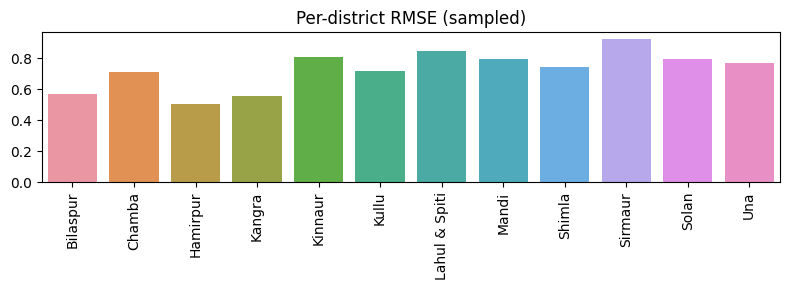

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


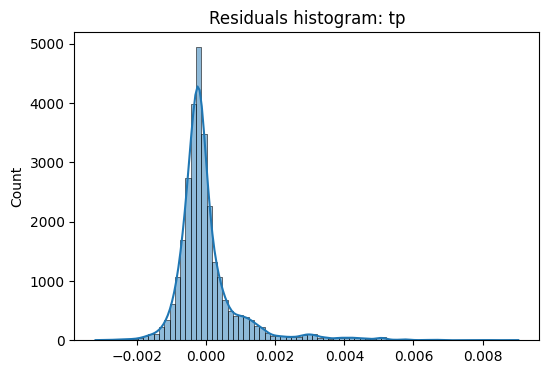

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


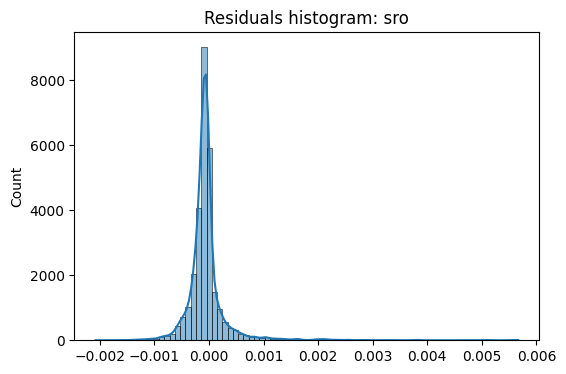

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


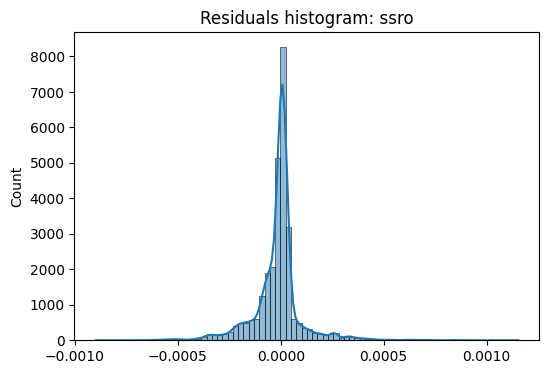

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


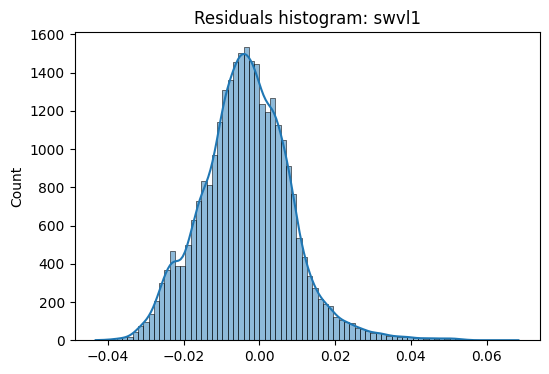

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


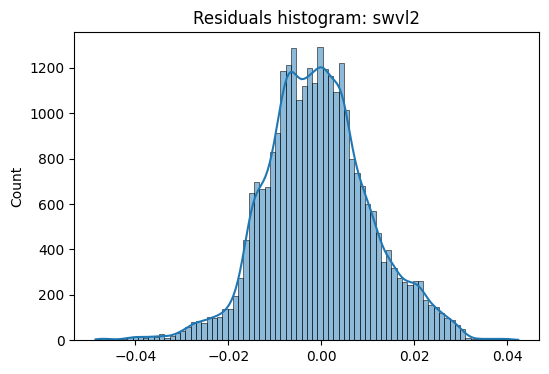

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


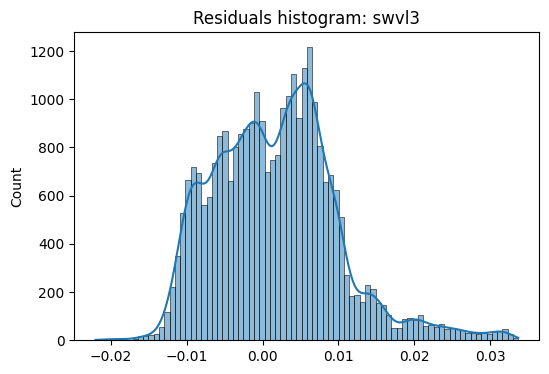

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


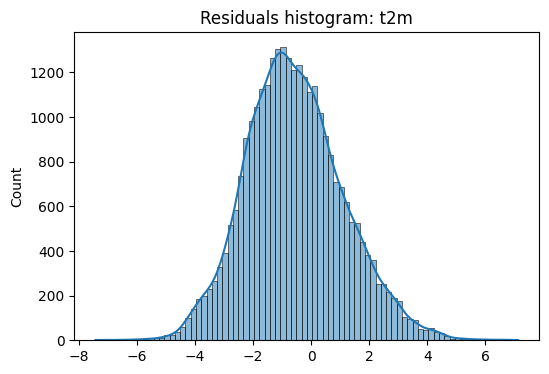

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


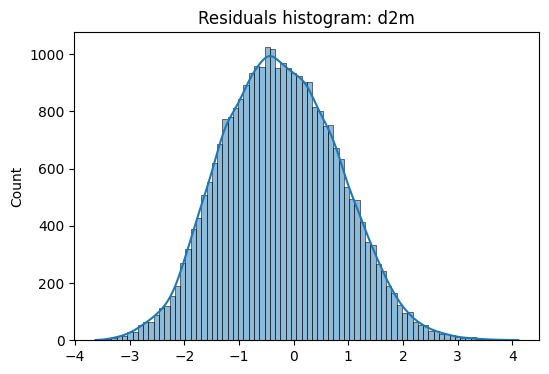

All plots saved to outputs
Script finished.


In [ ]:
N_plot_batches = 6
val_iter = iter(val_loader)
sample_count = 0
all_preds = []
all_trues = []
sample_meta = []
with torch.no_grad():
    for bidx in range(N_plot_batches):
        try:
            xb, yb, t_idxs = next(val_iter)
        except StopIteration:
            break
        xb = xb.to(DEVICE); yb = yb.to(DEVICE)
        yhat = model(xb)
        all_preds.append(yhat.cpu().numpy()) 
        all_trues.append(yb.cpu().numpy())
        sample_meta.append(t_idxs.numpy())
        sample_count += xb.size(0)


preds = np.concatenate(all_preds, axis=0)[:100] 
trues = np.concatenate(all_trues, axis=0)[:100]
S = preds.shape[0]
preds_reshaped = preds.reshape(-1, F)
trues_reshaped = trues.reshape(-1, F)
preds_inv = scaler.inverse_transform(preds_reshaped).reshape(S, num_nodes, HORIZON, F)
trues_inv = scaler.inverse_transform(trues_reshaped).reshape(S, num_nodes, HORIZON, F)

metrics = {}
for fi, fname in enumerate(FEATURE_COLS):
    y_true_f = trues_inv[:,:,:,fi].ravel()
    y_pred_f = preds_inv[:,:,:,fi].ravel()
    mse = mean_squared_error(y_true_f, y_pred_f)
    metrics[fname] = {"mse": mse}
print("Validation metrics (sampled windows):")
for k,v in metrics.items():
    print(f"  {k}: MSE={v['mse']:.4f}")

plot_district_indices = [0, max(0,num_nodes//3), max(0, 2*num_nodes//3), num_nodes-1]
for d_idx in plot_district_indices:
    for fi, fname in enumerate(FEATURE_COLS):
        plt.figure(figsize=(10,4))
        s = 0
        t = 0
        true_ts = trues_inv[s, d_idx, :, fi]
        pred_ts = preds_inv[s, d_idx, :, fi]
        hours = np.arange(HORIZON)
        plt.plot(hours, true_ts, label="true", marker='o')
        plt.plot(hours, pred_ts, label="pred", marker='x')
        plt.title(f"District={districts[d_idx]} | feature={fname} | horizon={HORIZON}h")
        plt.xlabel("hours ahead"); plt.ylabel(fname)
        plt.legend()
        outfn = os.path.join(OUTPUT_DIR, f"ts_d{d_idx}_{districts[d_idx]}_{fname}.png")
        plt.savefig(outfn); plt.close()

for fi, fname in enumerate(FEATURE_COLS):
    y_true_f = trues_inv[:,:,:,fi].ravel()
    y_pred_f = preds_inv[:,:,:,fi].ravel()
    plt.figure(figsize=(6,6))
    sns.scatterplot(x=y_true_f, y=y_pred_f, s=10, alpha=0.3)
    plt.plot([y_true_f.min(), y_true_f.max()], [y_true_f.min(), y_true_f.max()], 'r--')
    plt.xlabel("true"); plt.ylabel("pred")
    plt.title(f"Scatter: {fname}")
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, f"scatter_{fname}.png"))
    plt.close()

node_errors = []
for n in range(num_nodes):
    y_t = trues_inv[:,:, :, :].reshape(-1, F)[:, :]  
per_node_rmse = []
for n in range(num_nodes):
    y_true_n = trues_inv[:, n, :, :].reshape(-1, F)
    y_pred_n = preds_inv[:, n, :, :].reshape(-1, F)
    rmse = np.sqrt(((y_true_n - y_pred_n)**2).mean())
    per_node_rmse.append(rmse)
plt.figure(figsize=(8,3))
sns.barplot(x=districts, y=per_node_rmse)
plt.xticks(rotation=90)
plt.title("Per-district RMSE (sampled)")
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "per_district_rmse.png"))
plt.show()

for fi,fname in enumerate(FEATURE_COLS):
    res = (trues_inv[:,:,:,fi] - preds_inv[:,:,:,fi]).ravel()
    plt.figure(figsize=(6,4))
    sns.histplot(res, bins=80, kde=True)
    plt.title(f"Residuals histogram: {fname}")
    plt.savefig(os.path.join(OUTPUT_DIR, f"resid_hist_{fname}.png"))
    plt.show()

print("All plots saved to", OUTPUT_DIR)
print("Script finished.")

## Total Precipitation (August)

Plotting daily sums for August 2025 (744 hours) for 'tp'


Predicting August windows: 100%|██████████| 744/744 [00:00<00:00, 1043.00it/s]


Aggregated into 31 days (daily sums).


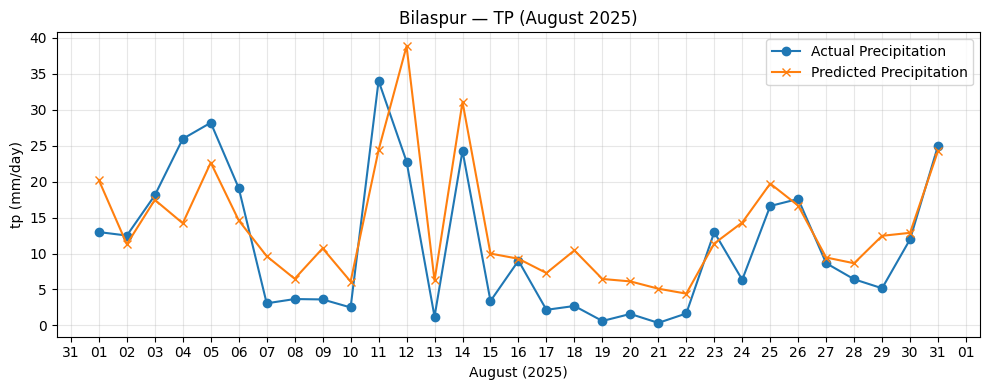

Saved: outputs/Bilaspur_Aug2025_tp_daily_sum.png


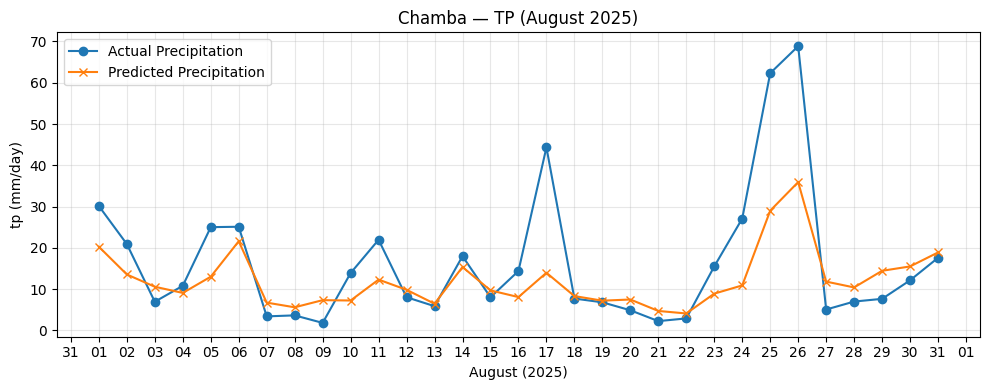

Saved: outputs/Chamba_Aug2025_tp_daily_sum.png


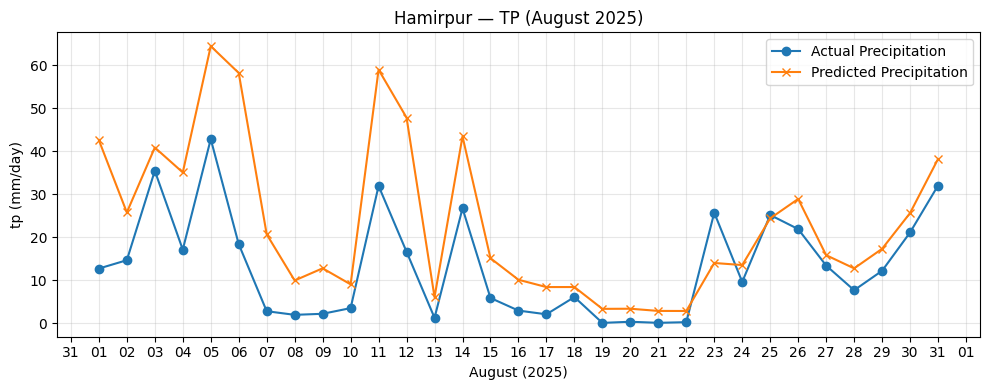

Saved: outputs/Hamirpur_Aug2025_tp_daily_sum.png


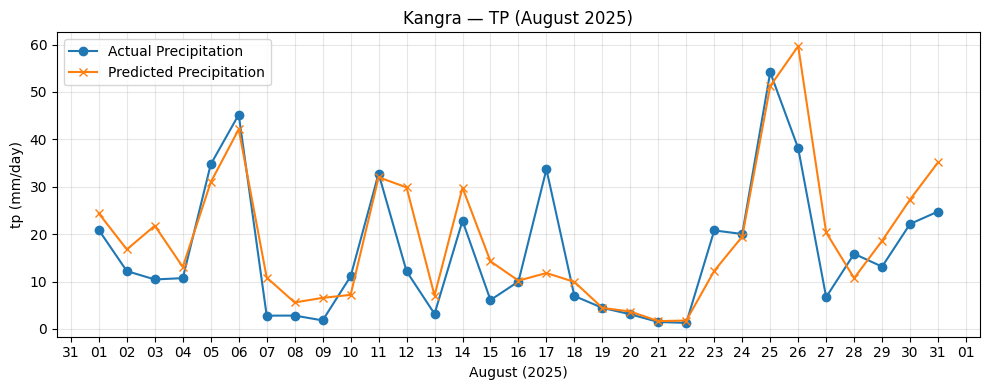

Saved: outputs/Kangra_Aug2025_tp_daily_sum.png


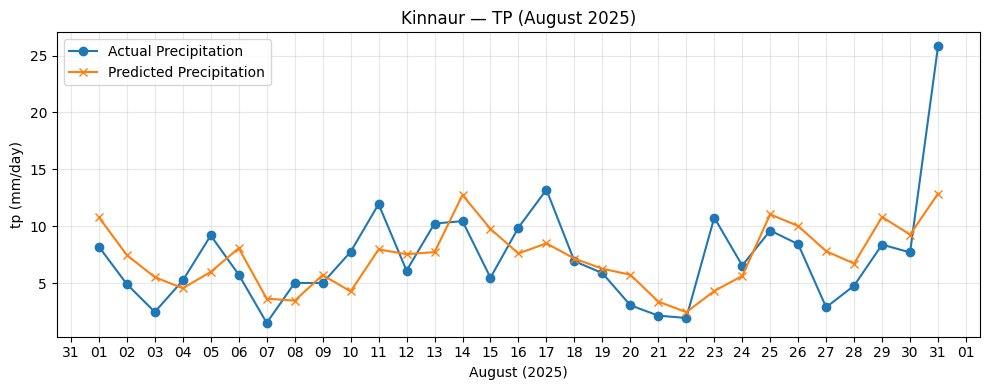

Saved: outputs/Kinnaur_Aug2025_tp_daily_sum.png


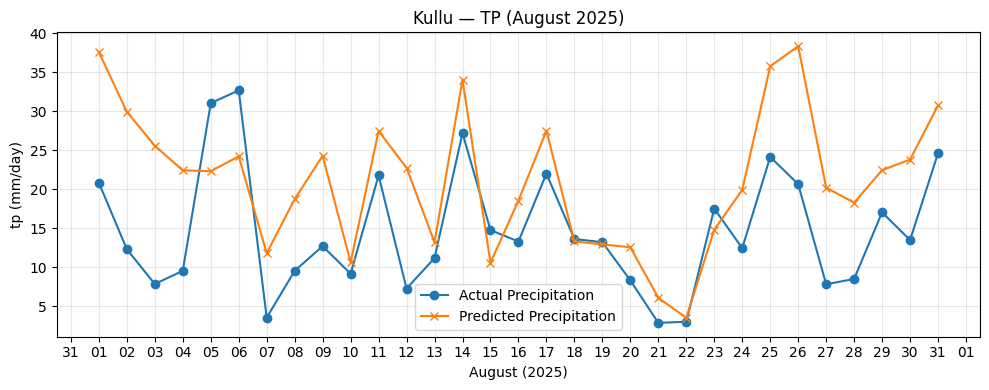

Saved: outputs/Kullu_Aug2025_tp_daily_sum.png


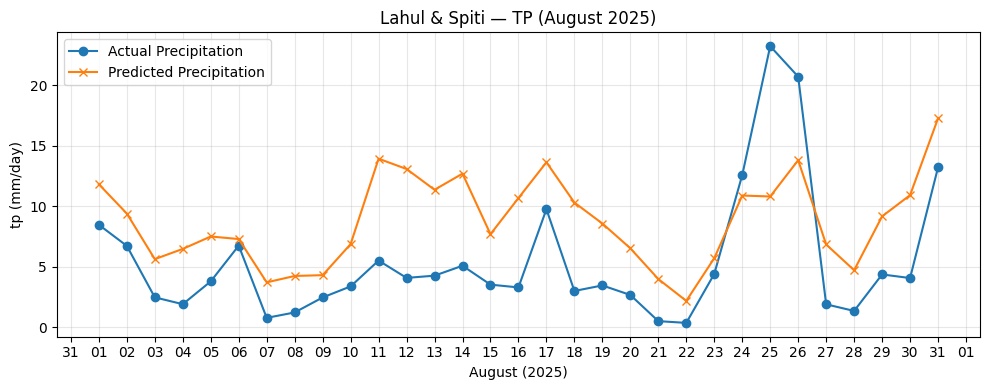

Saved: outputs/Lahul & Spiti_Aug2025_tp_daily_sum.png


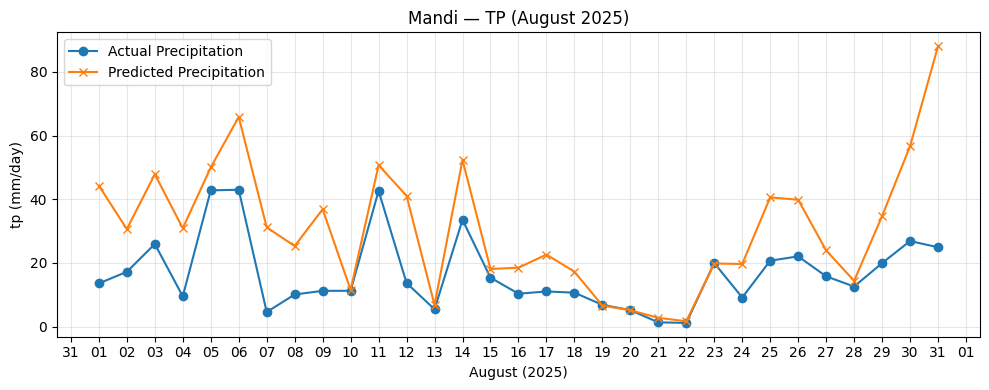

Saved: outputs/Mandi_Aug2025_tp_daily_sum.png


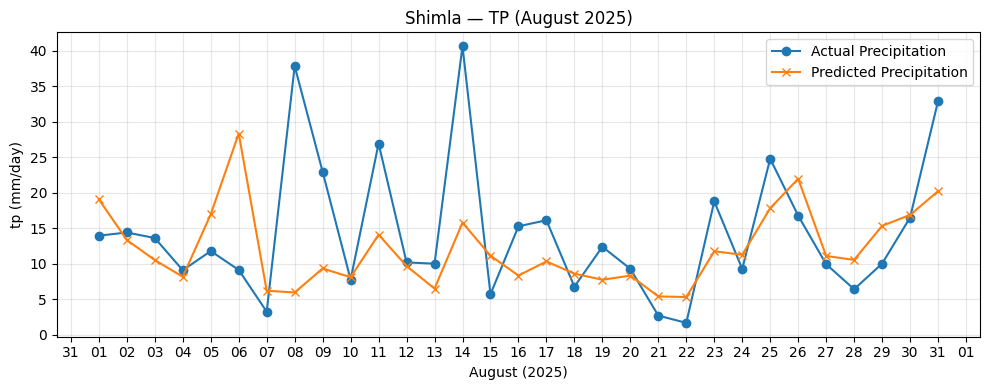

Saved: outputs/Shimla_Aug2025_tp_daily_sum.png


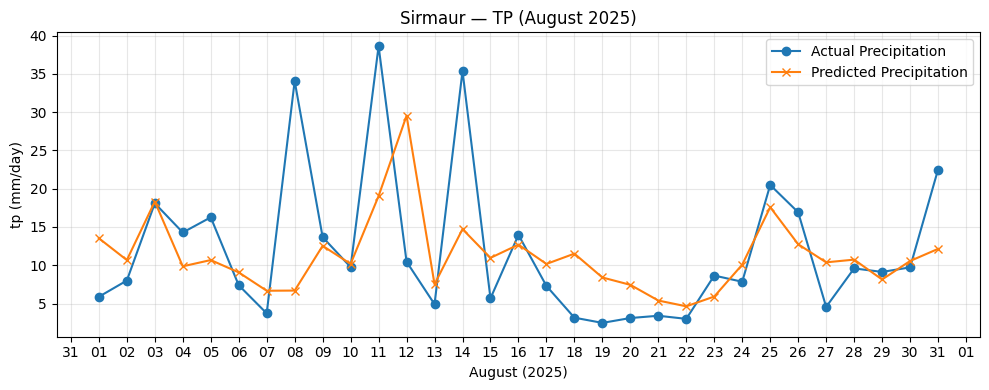

Saved: outputs/Sirmaur_Aug2025_tp_daily_sum.png


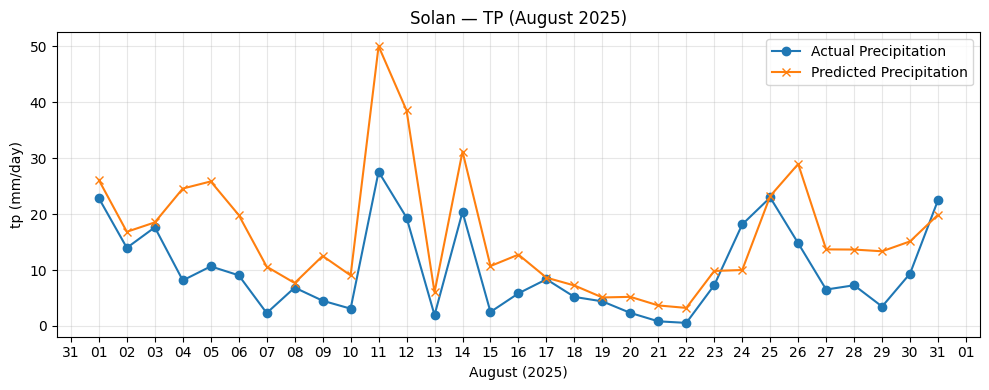

Saved: outputs/Solan_Aug2025_tp_daily_sum.png


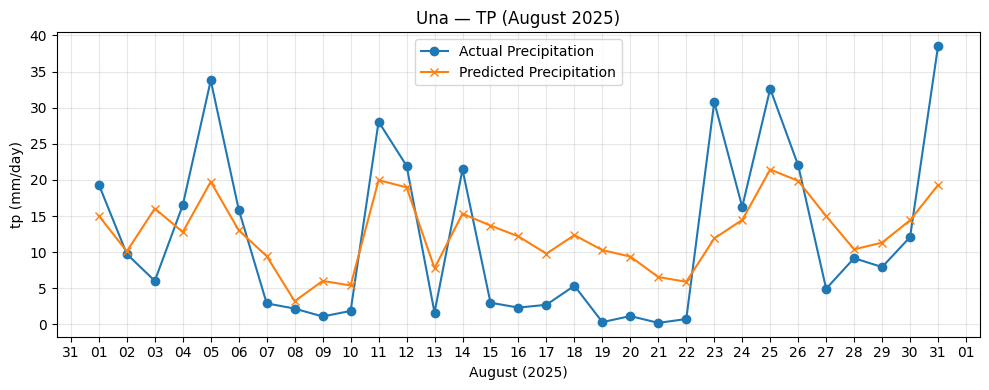

Saved: outputs/Una_Aug2025_tp_daily_sum.png
✅ Daily-sum plots for all districts saved to 'outputs/'


In [ ]:
import matplotlib.dates as mdates

FEATURE_TO_PLOT = "tp"   
feat_idx = FEATURE_COLS.index(FEATURE_TO_PLOT)
aug_mask = (full_time_index >= pd.to_datetime("2025-08-01")) & (full_time_index < pd.to_datetime("2025-09-01"))
aug_times = full_time_index[aug_mask]
aug_indices = np.where(aug_mask)[0]
print(f"Plotting daily sums for August 2025 ({len(aug_times)} hours) for '{FEATURE_TO_PLOT}'")
model.eval()
pred_series = np.zeros((num_nodes, len(aug_times)), dtype=np.float32)
true_series = data_scaled[:, aug_indices, feat_idx]

with torch.no_grad():
    for i, idx in enumerate(tqdm(aug_indices, desc="Predicting August windows")):
        if idx - PAST_SEQ < 0 or idx + HORIZON > data_scaled.shape[1]:
            continue
        x_input = data_scaled[:, idx - PAST_SEQ:idx, :]  
        x_input_t = torch.tensor(x_input, dtype=torch.float32).unsqueeze(0).to(DEVICE)
        y_pred = model(x_input_t) 
        y_pred = y_pred[0, :, 0, feat_idx].cpu().numpy()  
        pred_series[:, i] = y_pred

feat_mean = scaler.mean_[feat_idx]
feat_std = scaler.scale_[feat_idx]
pred_inv = pred_series * feat_std + feat_mean
true_inv = true_series * feat_std + feat_mean

df_pred = pd.DataFrame(pred_inv.T, index=aug_times, columns=districts)
df_true = pd.DataFrame(true_inv.T, index=aug_times, columns=districts)
df_pred_daily = df_pred.resample("1D").sum()
df_true_daily = df_true.resample("1D").sum()

days = df_true_daily.index
print(f"Aggregated into {len(days)} days (daily sums).")
for d in districts:
    plt.figure(figsize=(10,4))
    plt.plot(days, df_true_daily[d]*1000, label="Actual Precipitation", marker='o')
    plt.plot(days, df_pred_daily[d]*1000, label="Predicted Precipitation", marker='x')
    plt.title(f"{d} — {FEATURE_TO_PLOT.upper()} (August 2025)")
    plt.xlabel("August (2025)")
    plt.ylabel(f"{FEATURE_TO_PLOT} (mm/day)")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%d"))
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"{d}_Aug2025_{FEATURE_TO_PLOT}_daily_sum.png")
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")
print(f"✅ Daily-sum plots for all districts saved to '{OUTPUT_DIR}/'")


## Total Precipitation (September)

Plotting daily sums for Sept 2025 (720 hours) for 'tp'


Predicting Sept windows: 100%|██████████| 720/720 [00:00<00:00, 1061.49it/s]


Aggregated into 30 days (daily sums).


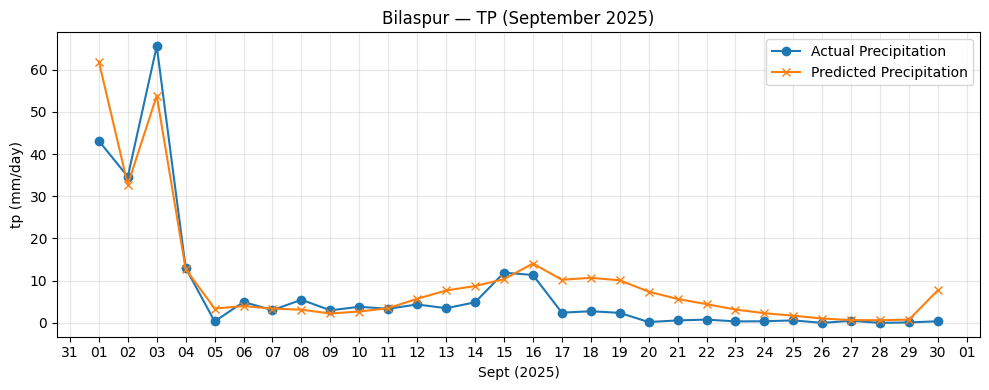

Saved: outputs/Bilaspur_Aug2025_tp_daily_sum.png


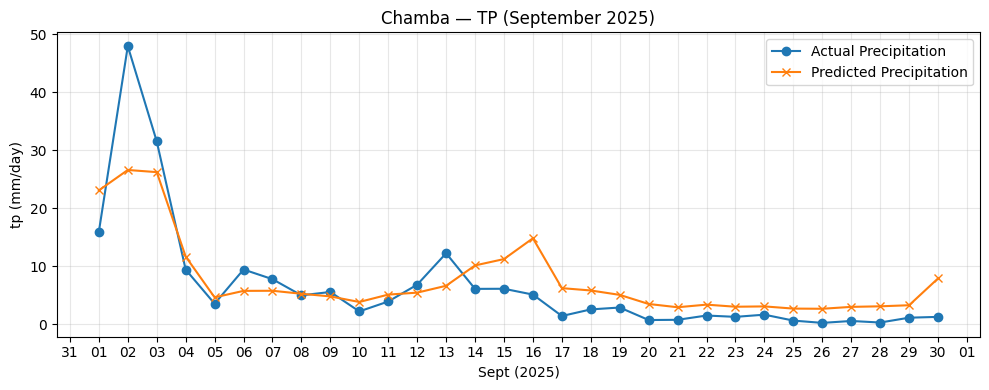

Saved: outputs/Chamba_Aug2025_tp_daily_sum.png


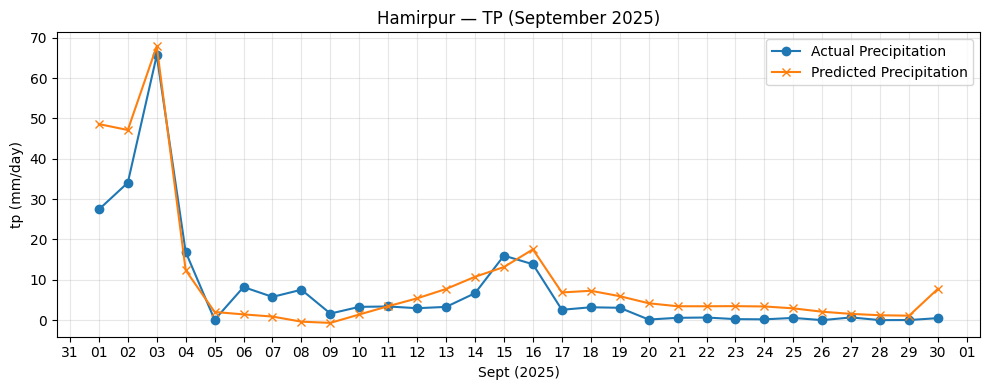

Saved: outputs/Hamirpur_Aug2025_tp_daily_sum.png


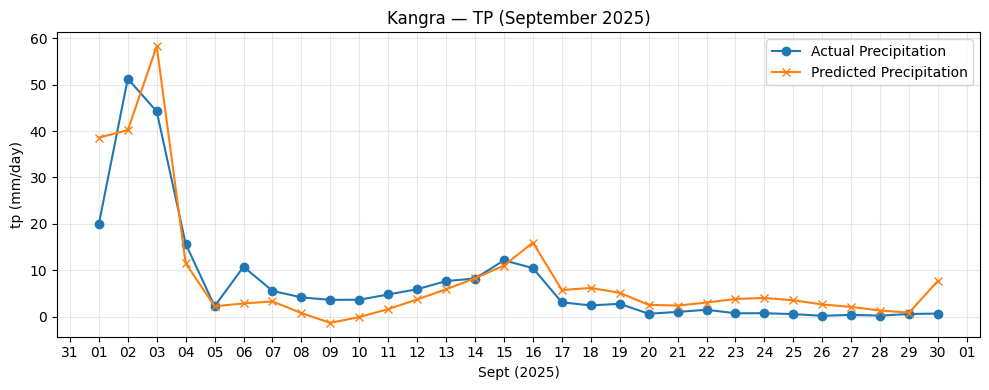

Saved: outputs/Kangra_Aug2025_tp_daily_sum.png


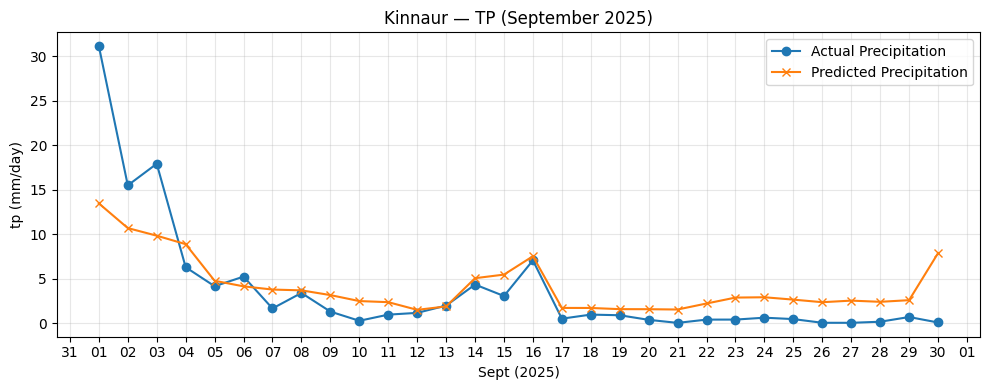

Saved: outputs/Kinnaur_Aug2025_tp_daily_sum.png


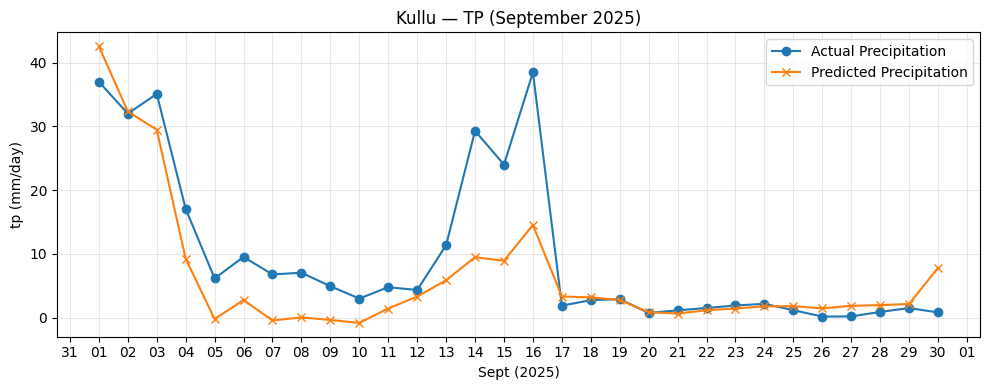

Saved: outputs/Kullu_Aug2025_tp_daily_sum.png


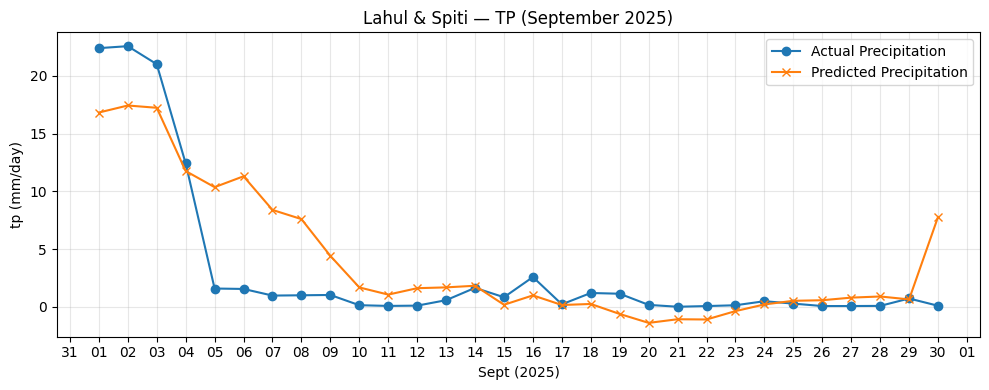

Saved: outputs/Lahul & Spiti_Aug2025_tp_daily_sum.png


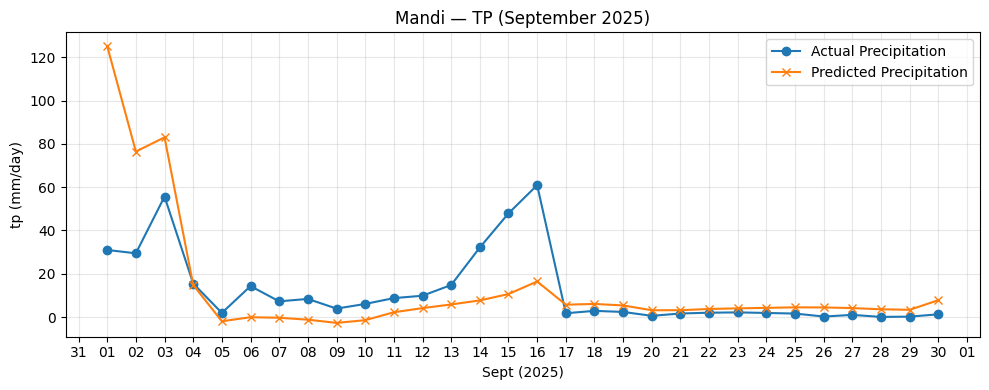

Saved: outputs/Mandi_Aug2025_tp_daily_sum.png


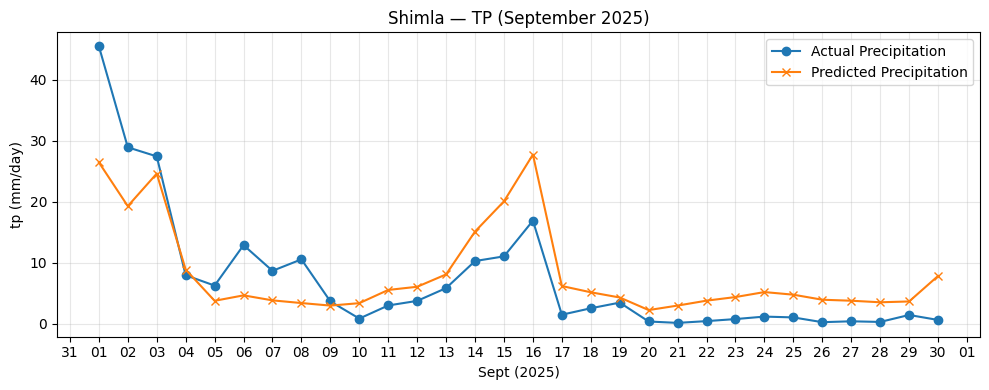

Saved: outputs/Shimla_Aug2025_tp_daily_sum.png


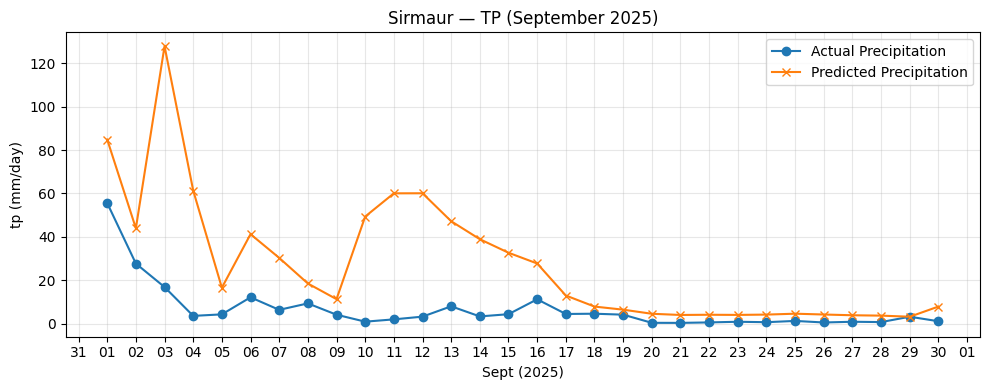

Saved: outputs/Sirmaur_Aug2025_tp_daily_sum.png


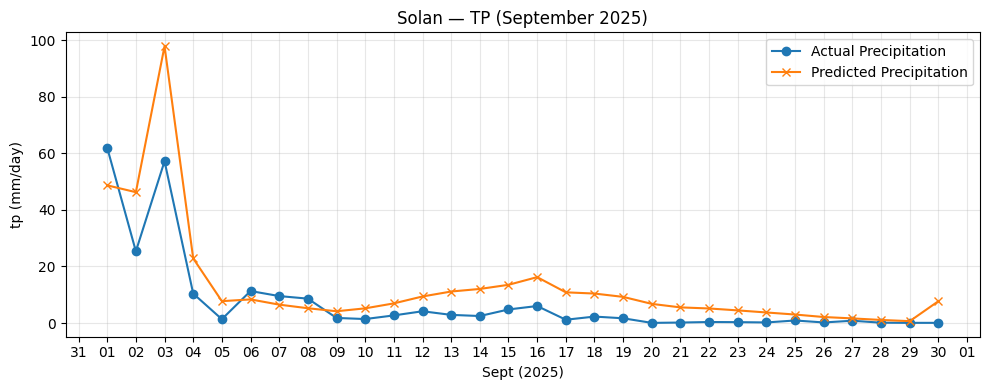

Saved: outputs/Solan_Aug2025_tp_daily_sum.png


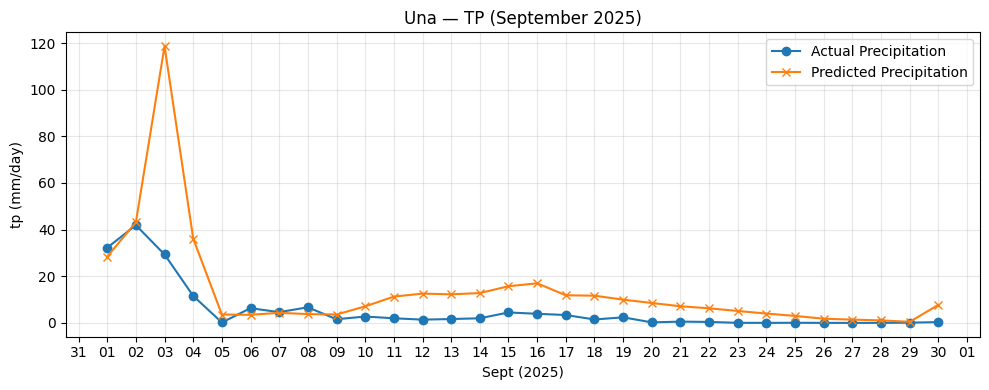

Saved: outputs/Una_Aug2025_tp_daily_sum.png
✅ Daily-sum plots for all districts saved to 'outputs/'


In [ ]:
import matplotlib.dates as mdates

FEATURE_TO_PLOT = "tp"  
feat_idx = FEATURE_COLS.index(FEATURE_TO_PLOT)
aug_mask = (full_time_index >= pd.to_datetime("2025-09-01")) & (full_time_index < pd.to_datetime("2025-10-01"))
aug_times = full_time_index[aug_mask]
aug_indices = np.where(aug_mask)[0]
print(f"Plotting daily sums for Sept 2025 ({len(aug_times)} hours) for '{FEATURE_TO_PLOT}'")
model.eval()
pred_series = np.zeros((num_nodes, len(aug_times)), dtype=np.float32)
true_series = data_scaled[:, aug_indices, feat_idx]

with torch.no_grad():
    for i, idx in enumerate(tqdm(aug_indices, desc="Predicting Sept windows")):
        if idx - PAST_SEQ < 0 or idx + HORIZON > data_scaled.shape[1]:
            continue
        x_input = data_scaled[:, idx - PAST_SEQ:idx, :]
        x_input_t = torch.tensor(x_input, dtype=torch.float32).unsqueeze(0).to(DEVICE)
        y_pred = model(x_input_t)  
        y_pred = y_pred[0, :, 0, feat_idx].cpu().numpy() 
        pred_series[:, i] = y_pred

feat_mean = scaler.mean_[feat_idx]
feat_std = scaler.scale_[feat_idx]
pred_inv = pred_series * feat_std + feat_mean
true_inv = true_series * feat_std + feat_mean
df_pred = pd.DataFrame(pred_inv.T, index=aug_times, columns=districts)
df_true = pd.DataFrame(true_inv.T, index=aug_times, columns=districts)
df_pred_daily = df_pred.resample("1D").sum()
df_true_daily = df_true.resample("1D").sum()

days = df_true_daily.index
print(f"Aggregated into {len(days)} days (daily sums).")

for d in districts:
    plt.figure(figsize=(10,4))
    plt.plot(days, df_true_daily[d]*1000, label="Actual Precipitation", marker='o')
    plt.plot(days, df_pred_daily[d]*1000, label="Predicted Precipitation", marker='x')
    plt.title(f"{d} — {FEATURE_TO_PLOT.upper()} (September 2025)")
    plt.xlabel("Sept (2025)")
    plt.ylabel(f"{FEATURE_TO_PLOT} (mm/day)")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%d"))
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"{d}_Aug2025_{FEATURE_TO_PLOT}_daily_sum.png")
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")

print(f"✅ Daily-sum plots for all districts saved to '{OUTPUT_DIR}/'")


## SRO (August)

Plotting daily sums for August 2025 (744 hours) for 'sro'


Predicting August windows: 100%|██████████| 744/744 [00:00<00:00, 1038.21it/s]


Aggregated into 31 days (daily sums).


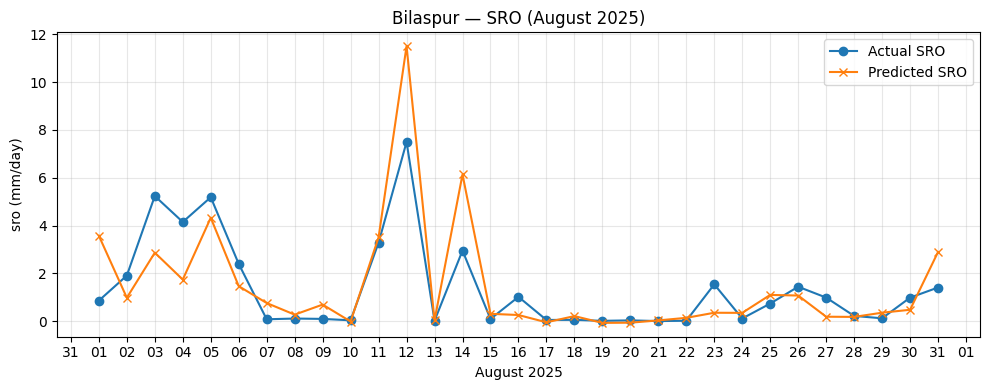

Saved: outputs/Bilaspur_Aug2025_sro_daily_sum.png


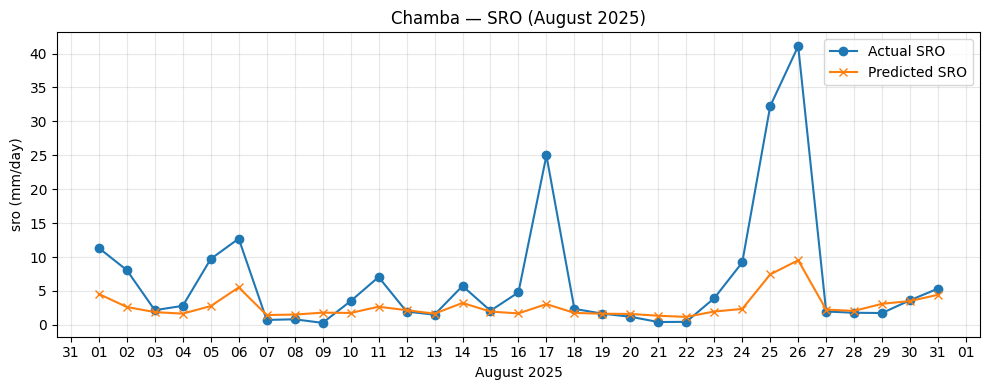

Saved: outputs/Chamba_Aug2025_sro_daily_sum.png


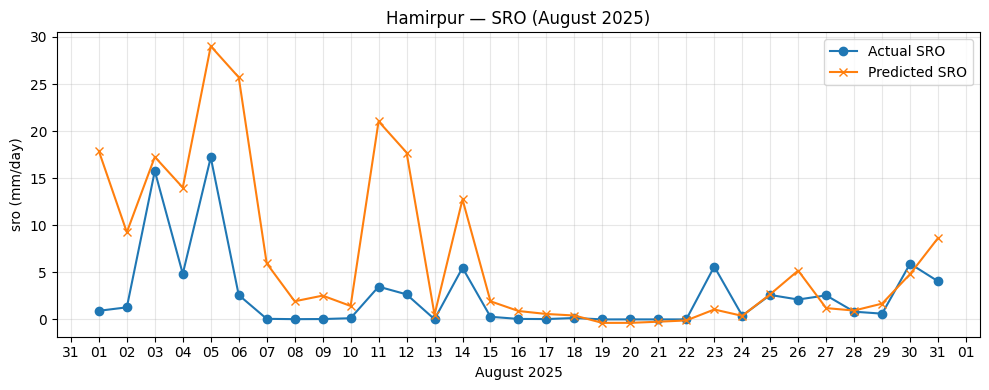

Saved: outputs/Hamirpur_Aug2025_sro_daily_sum.png


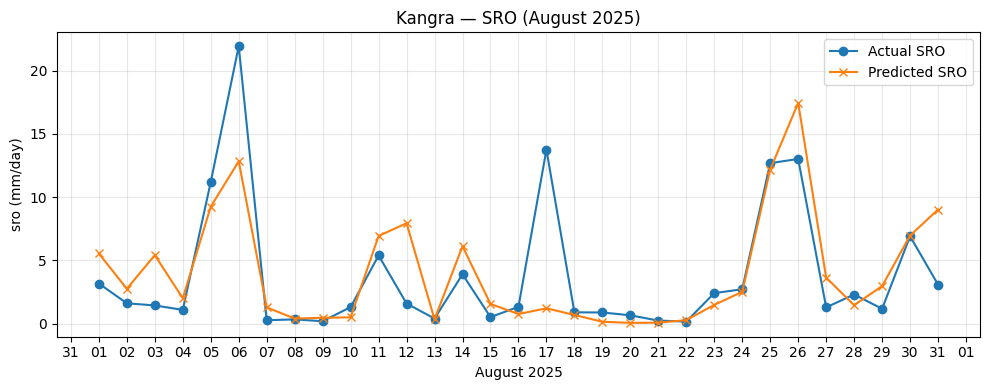

Saved: outputs/Kangra_Aug2025_sro_daily_sum.png


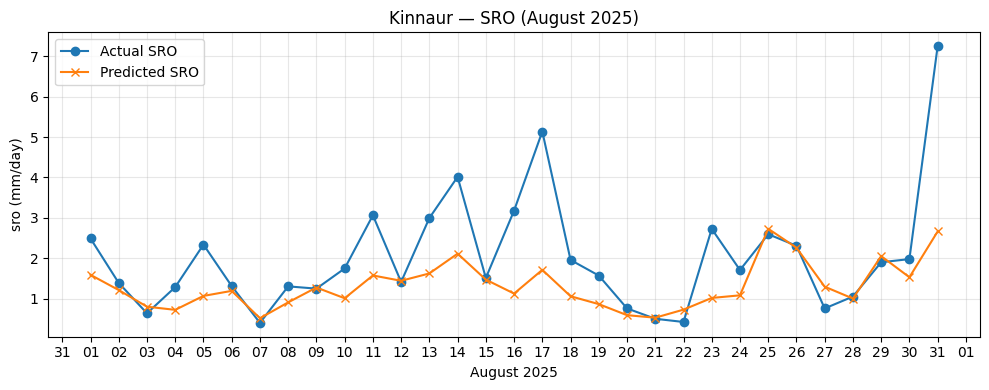

Saved: outputs/Kinnaur_Aug2025_sro_daily_sum.png


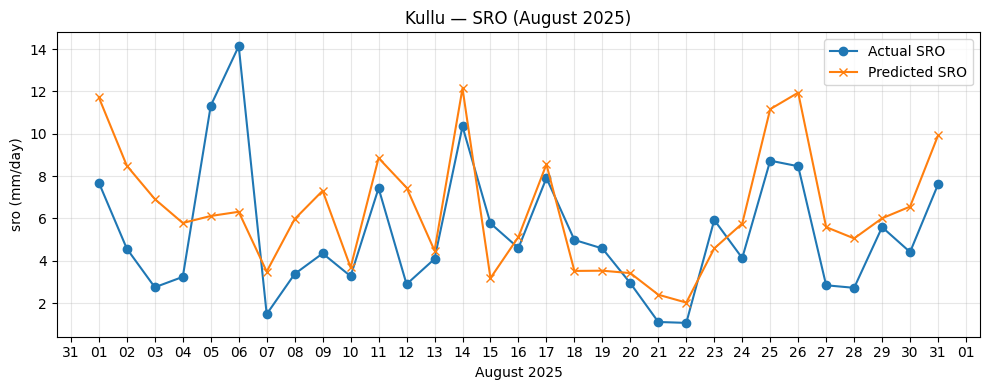

Saved: outputs/Kullu_Aug2025_sro_daily_sum.png


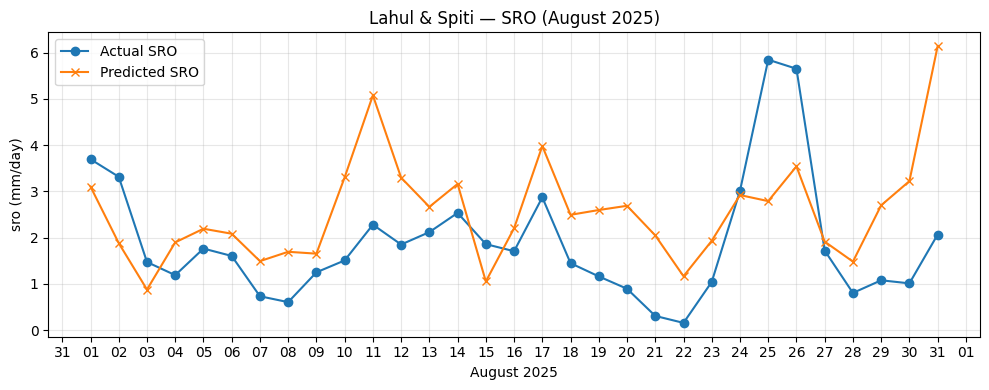

Saved: outputs/Lahul & Spiti_Aug2025_sro_daily_sum.png


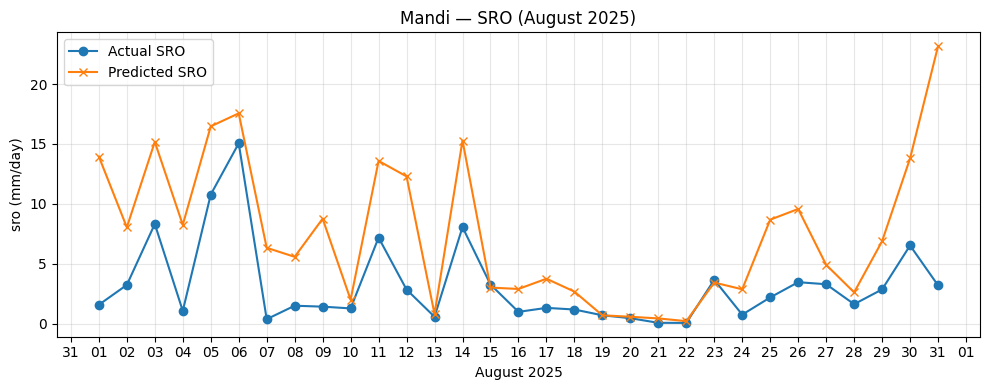

Saved: outputs/Mandi_Aug2025_sro_daily_sum.png


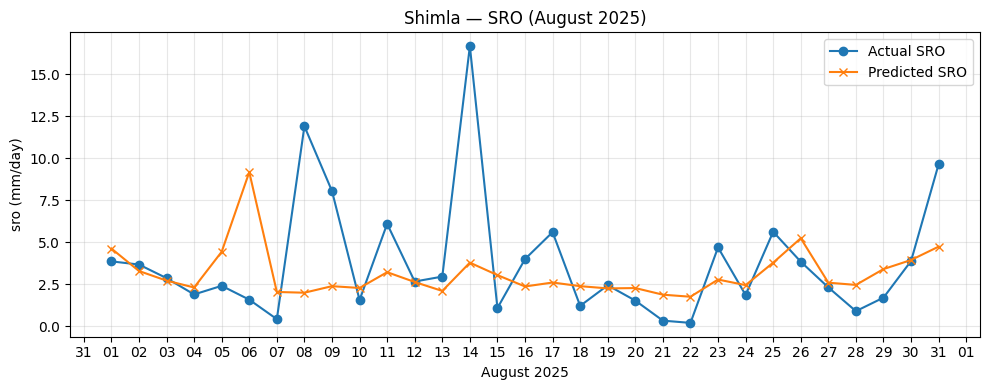

Saved: outputs/Shimla_Aug2025_sro_daily_sum.png


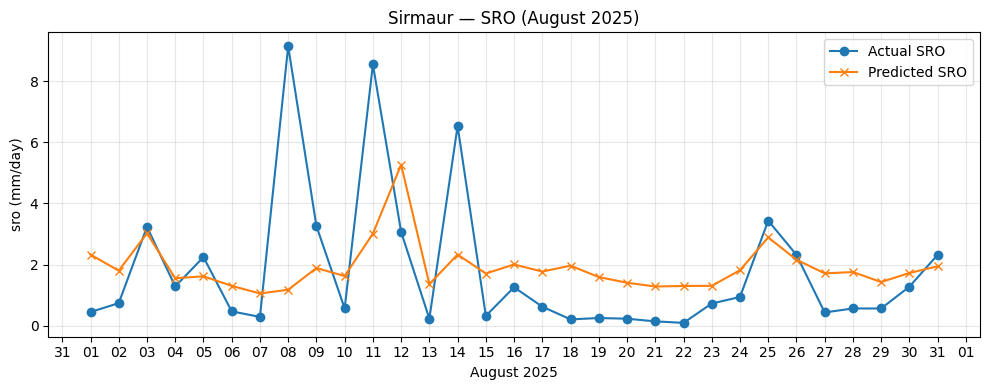

Saved: outputs/Sirmaur_Aug2025_sro_daily_sum.png


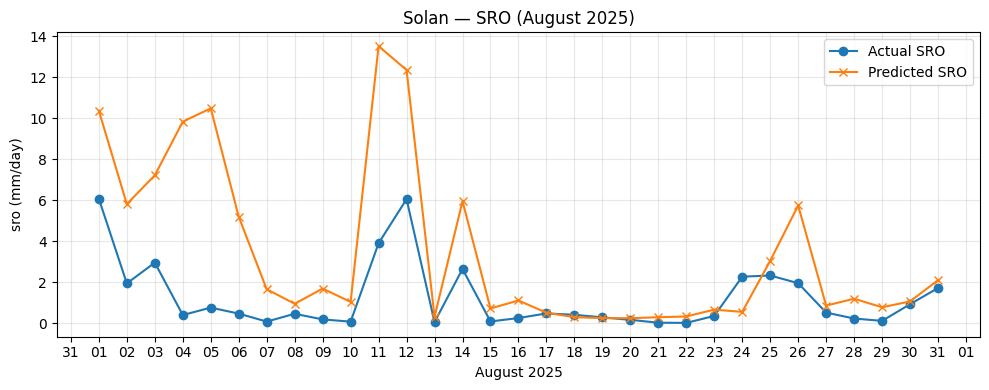

Saved: outputs/Solan_Aug2025_sro_daily_sum.png


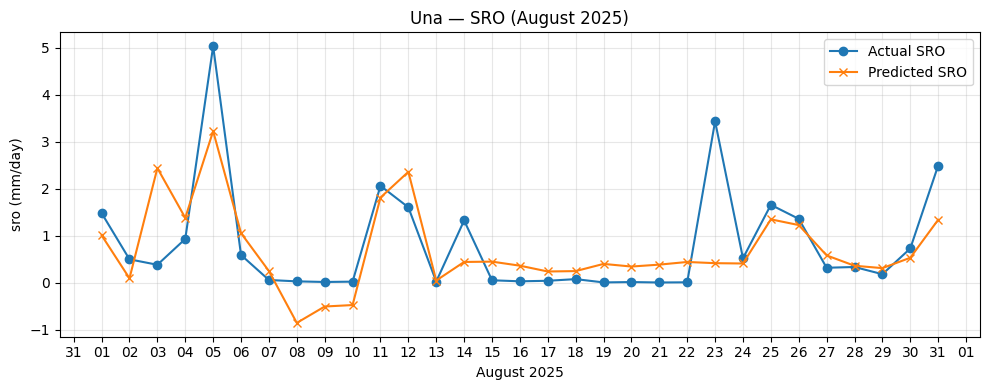

Saved: outputs/Una_Aug2025_sro_daily_sum.png
✅ Daily-sum plots for all districts saved to 'outputs/'


In [ ]:
import matplotlib.dates as mdates

FEATURE_TO_PLOT = "sro"  
feat_idx = FEATURE_COLS.index(FEATURE_TO_PLOT)
aug_mask = (full_time_index >= pd.to_datetime("2025-08-01")) & (full_time_index < pd.to_datetime("2025-09-01"))
aug_times = full_time_index[aug_mask]
aug_indices = np.where(aug_mask)[0]
print(f"Plotting daily sums for August 2025 ({len(aug_times)} hours) for '{FEATURE_TO_PLOT}'")
model.eval()
pred_series = np.zeros((num_nodes, len(aug_times)), dtype=np.float32)
true_series = data_scaled[:, aug_indices, feat_idx]

with torch.no_grad():
    for i, idx in enumerate(tqdm(aug_indices, desc="Predicting August windows")):
        if idx - PAST_SEQ < 0 or idx + HORIZON > data_scaled.shape[1]:
            continue
        x_input = data_scaled[:, idx - PAST_SEQ:idx, :]
        x_input_t = torch.tensor(x_input, dtype=torch.float32).unsqueeze(0).to(DEVICE)
        y_pred = model(x_input_t)  
        y_pred = y_pred[0, :, 0, feat_idx].cpu().numpy()
        pred_series[:, i] = y_pred

feat_mean = scaler.mean_[feat_idx]
feat_std = scaler.scale_[feat_idx]
pred_inv = pred_series * feat_std + feat_mean
true_inv = true_series * feat_std + feat_mean
df_pred = pd.DataFrame(pred_inv.T, index=aug_times, columns=districts)
df_true = pd.DataFrame(true_inv.T, index=aug_times, columns=districts)
df_pred_daily = df_pred.resample("1D").sum()
df_true_daily = df_true.resample("1D").sum()

days = df_true_daily.index
print(f"Aggregated into {len(days)} days (daily sums).")

for d in districts:
    plt.figure(figsize=(10,4))
    plt.plot(days, df_true_daily[d]*1000, label="Actual SRO", marker='o')
    plt.plot(days, df_pred_daily[d]*1000, label="Predicted SRO", marker='x')
    plt.title(f"{d} — {FEATURE_TO_PLOT.upper()} (August 2025)")
    plt.xlabel("August 2025")
    plt.ylabel(f"{FEATURE_TO_PLOT} (mm/day)")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%d"))
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"{d}_Aug2025_{FEATURE_TO_PLOT}_daily_sum.png")
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")

print(f"✅ Daily-sum plots for all districts saved to '{OUTPUT_DIR}/'")


## SSRO (August)

Plotting daily sums for August 2025 (744 hours) for 'ssro'


Predicting August windows: 100%|██████████| 744/744 [00:00<00:00, 1031.40it/s]


Aggregated into 31 days (daily sums).


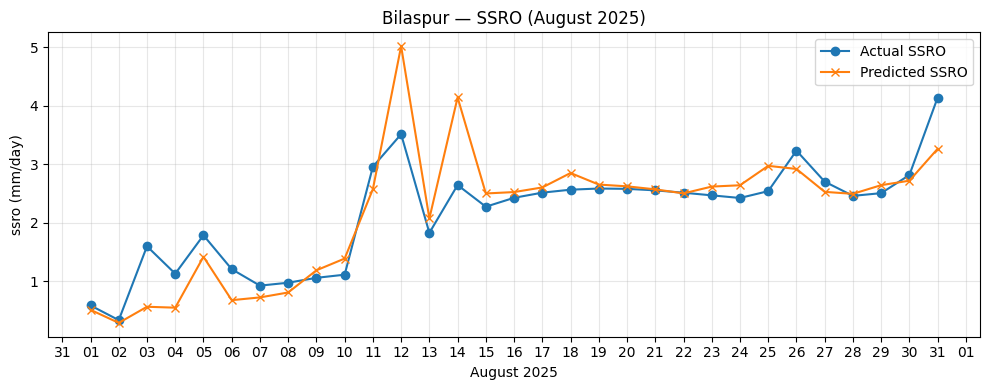

Saved: outputs/Bilaspur_Aug2025_ssro_daily_sum.png


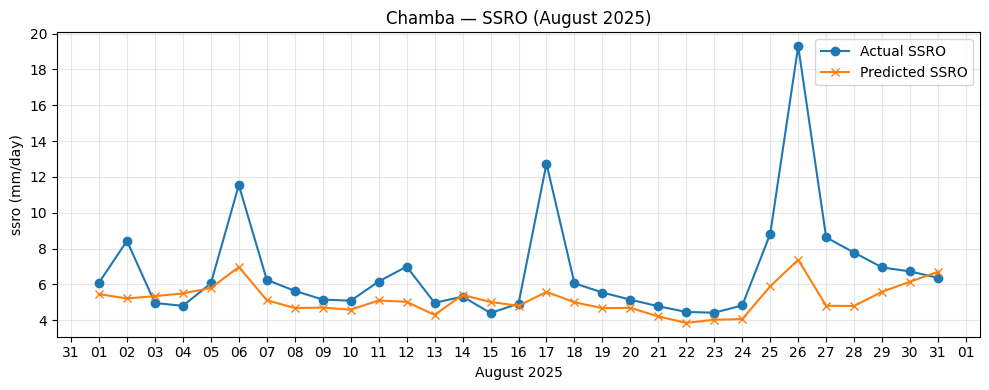

Saved: outputs/Chamba_Aug2025_ssro_daily_sum.png


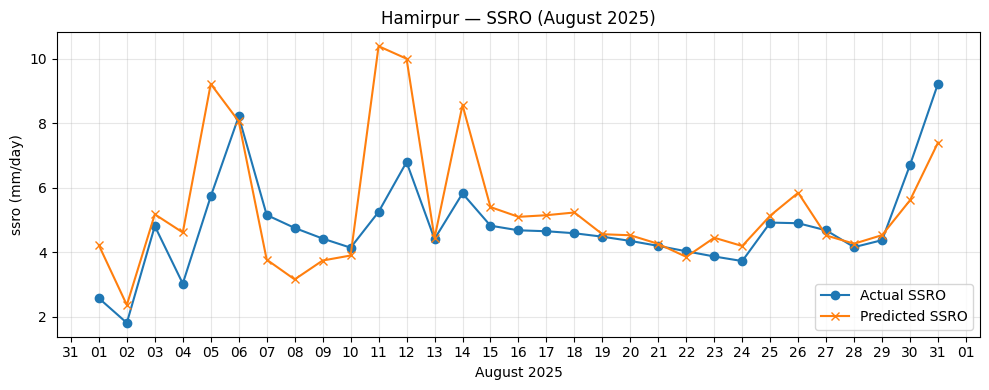

Saved: outputs/Hamirpur_Aug2025_ssro_daily_sum.png


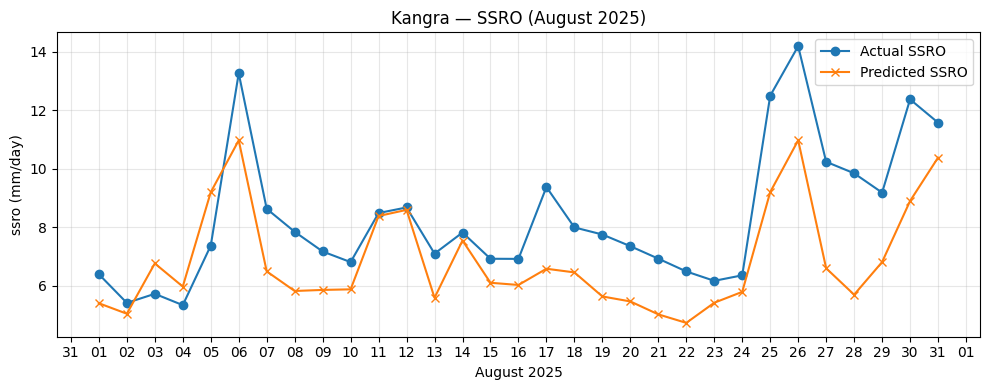

Saved: outputs/Kangra_Aug2025_ssro_daily_sum.png


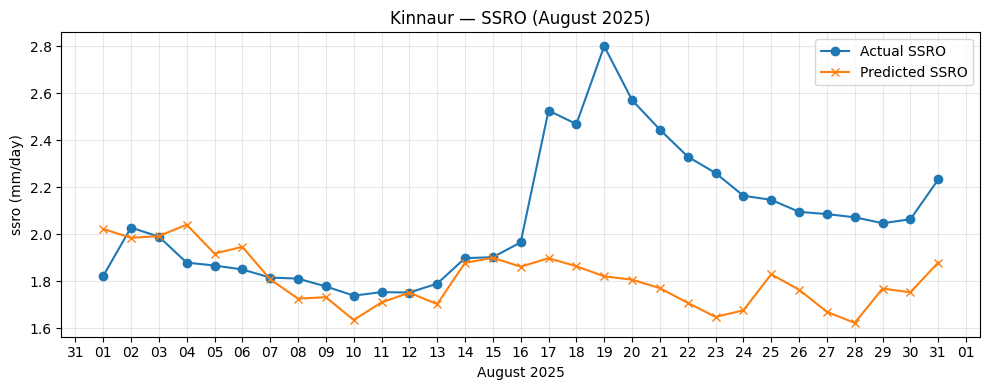

Saved: outputs/Kinnaur_Aug2025_ssro_daily_sum.png


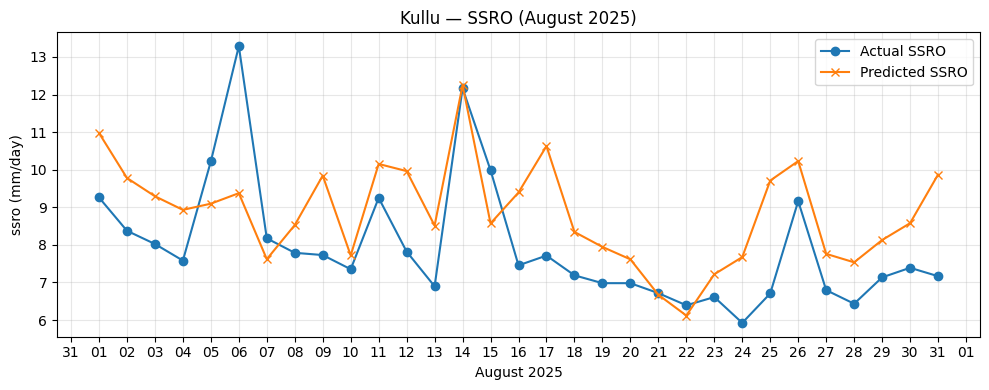

Saved: outputs/Kullu_Aug2025_ssro_daily_sum.png


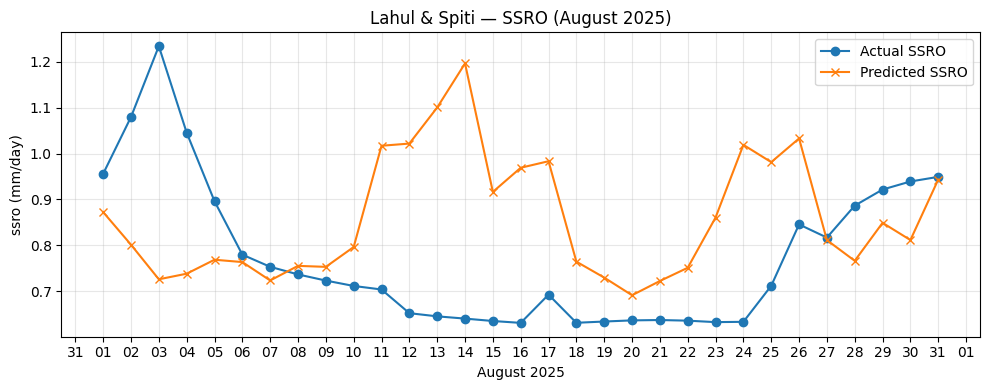

Saved: outputs/Lahul & Spiti_Aug2025_ssro_daily_sum.png


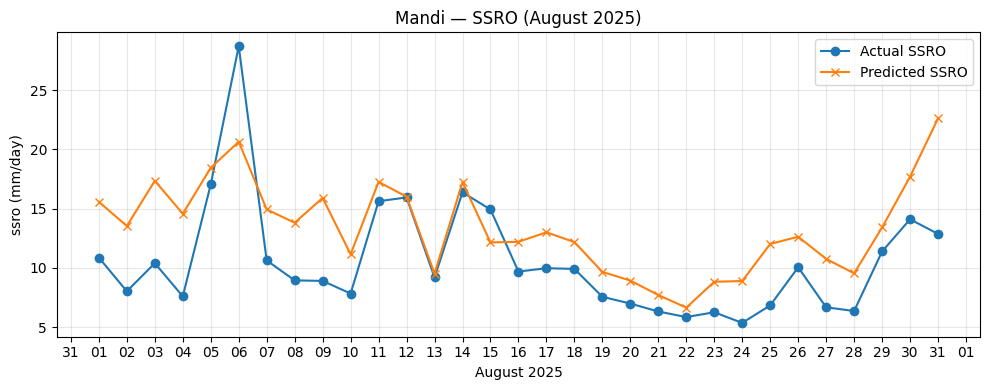

Saved: outputs/Mandi_Aug2025_ssro_daily_sum.png


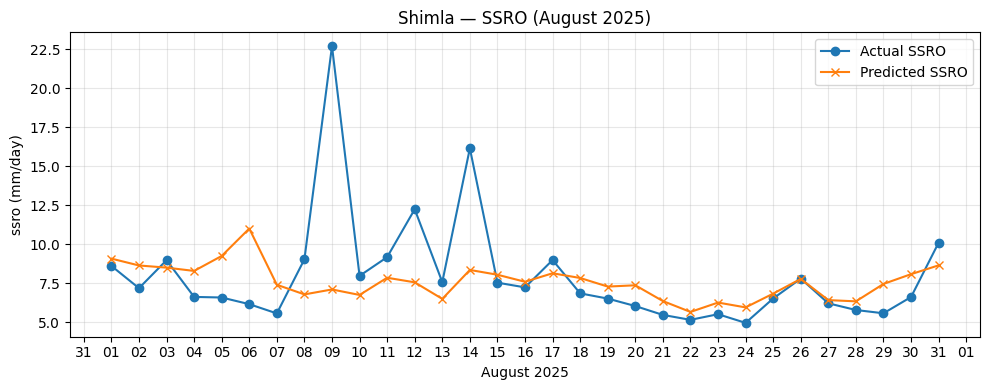

Saved: outputs/Shimla_Aug2025_ssro_daily_sum.png


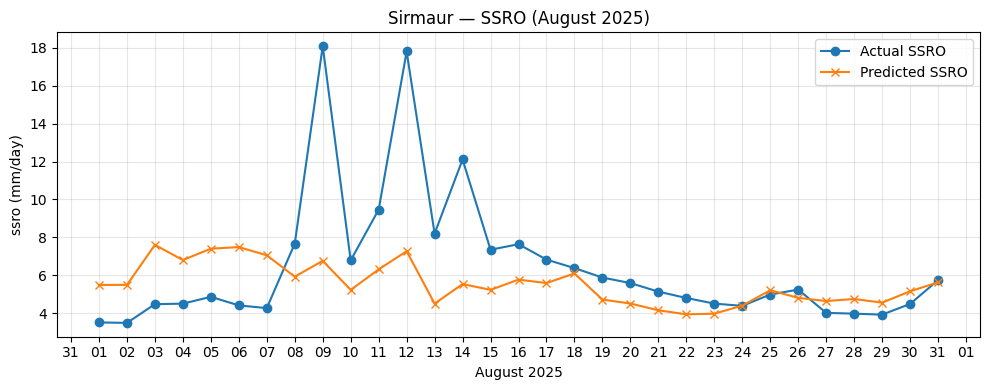

Saved: outputs/Sirmaur_Aug2025_ssro_daily_sum.png


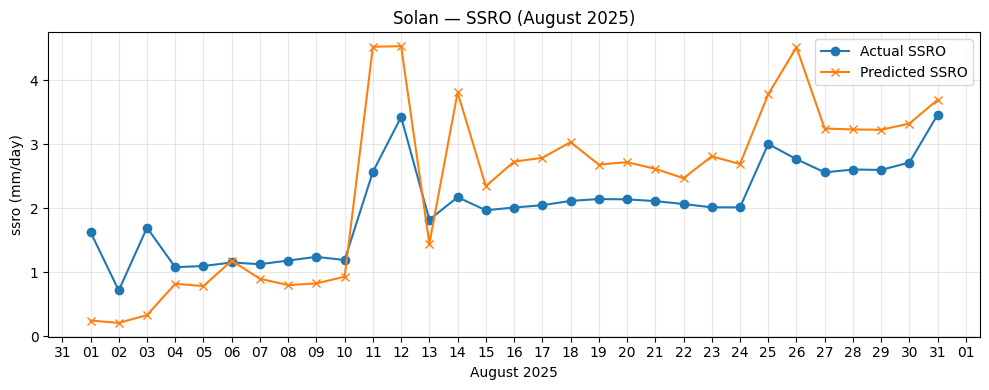

Saved: outputs/Solan_Aug2025_ssro_daily_sum.png


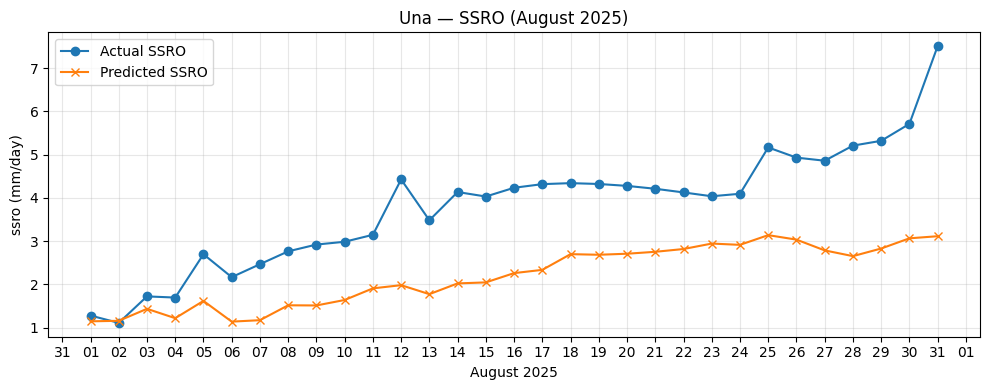

Saved: outputs/Una_Aug2025_ssro_daily_sum.png
✅ Daily-sum plots for all districts saved to 'outputs/'


In [ ]:
import matplotlib.dates as mdates

FEATURE_TO_PLOT = "ssro"  
feat_idx = FEATURE_COLS.index(FEATURE_TO_PLOT)
aug_mask = (full_time_index >= pd.to_datetime("2025-08-01")) & (full_time_index < pd.to_datetime("2025-09-01"))
aug_times = full_time_index[aug_mask]
aug_indices = np.where(aug_mask)[0]
print(f"Plotting daily sums for August 2025 ({len(aug_times)} hours) for '{FEATURE_TO_PLOT}'")
model.eval()
pred_series = np.zeros((num_nodes, len(aug_times)), dtype=np.float32)
true_series = data_scaled[:, aug_indices, feat_idx]

with torch.no_grad():
    for i, idx in enumerate(tqdm(aug_indices, desc="Predicting August windows")):
        if idx - PAST_SEQ < 0 or idx + HORIZON > data_scaled.shape[1]:
            continue
        x_input = data_scaled[:, idx - PAST_SEQ:idx, :]
        x_input_t = torch.tensor(x_input, dtype=torch.float32).unsqueeze(0).to(DEVICE)
        y_pred = model(x_input_t) 
        y_pred = y_pred[0, :, 0, feat_idx].cpu().numpy() 
        pred_series[:, i] = y_pred

feat_mean = scaler.mean_[feat_idx]
feat_std = scaler.scale_[feat_idx]
pred_inv = pred_series * feat_std + feat_mean
true_inv = true_series * feat_std + feat_mean
df_pred = pd.DataFrame(pred_inv.T, index=aug_times, columns=districts)
df_true = pd.DataFrame(true_inv.T, index=aug_times, columns=districts)
df_pred_daily = df_pred.resample("1D").sum()
df_true_daily = df_true.resample("1D").sum()
days = df_true_daily.index
print(f"Aggregated into {len(days)} days (daily sums).")

for d in districts:
    plt.figure(figsize=(10,4))
    plt.plot(days, df_true_daily[d]*1000, label="Actual SSRO", marker='o')
    plt.plot(days, df_pred_daily[d]*1000, label="Predicted SSRO", marker='x')
    plt.title(f"{d} — {FEATURE_TO_PLOT.upper()} (August 2025)")
    plt.xlabel("August 2025")
    plt.ylabel(f"{FEATURE_TO_PLOT} (mm/day)")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%d"))
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"{d}_Aug2025_{FEATURE_TO_PLOT}_daily_sum.png")
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")

print(f"✅ Daily-sum plots for all districts saved to '{OUTPUT_DIR}/'")


## SWVL1 (August)

Plotting daily sums for August 2025 (744 hours) for 'swvl1'


Predicting August windows: 100%|██████████| 744/744 [00:00<00:00, 1044.18it/s]


Aggregated into 31 days (daily sums).


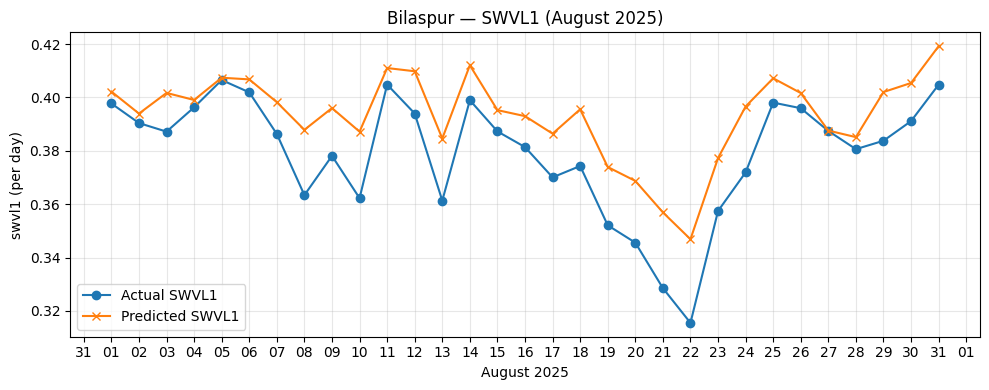

Saved: outputs/Bilaspur_Aug2025_swvl1_daily_sum.png


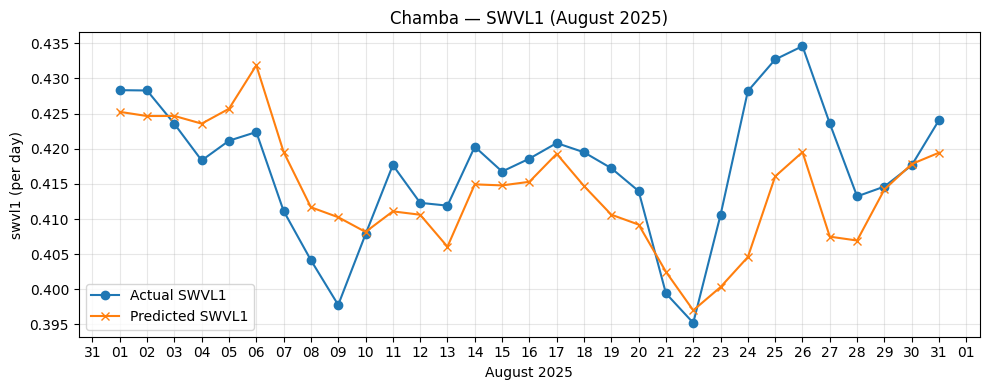

Saved: outputs/Chamba_Aug2025_swvl1_daily_sum.png


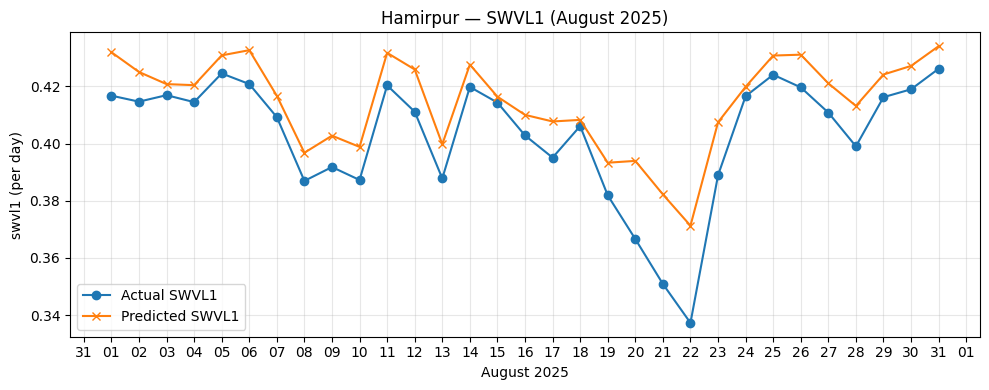

Saved: outputs/Hamirpur_Aug2025_swvl1_daily_sum.png


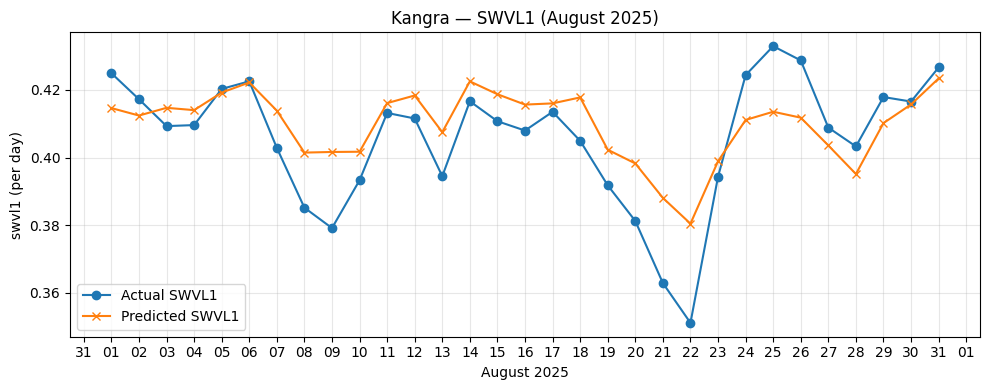

Saved: outputs/Kangra_Aug2025_swvl1_daily_sum.png


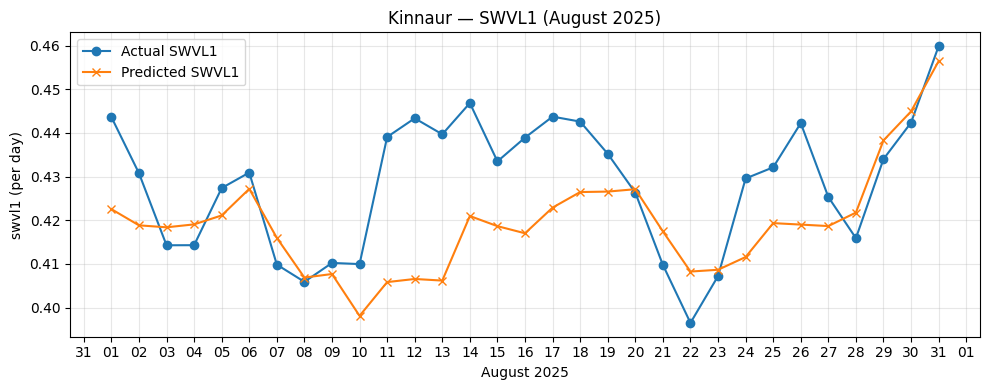

Saved: outputs/Kinnaur_Aug2025_swvl1_daily_sum.png


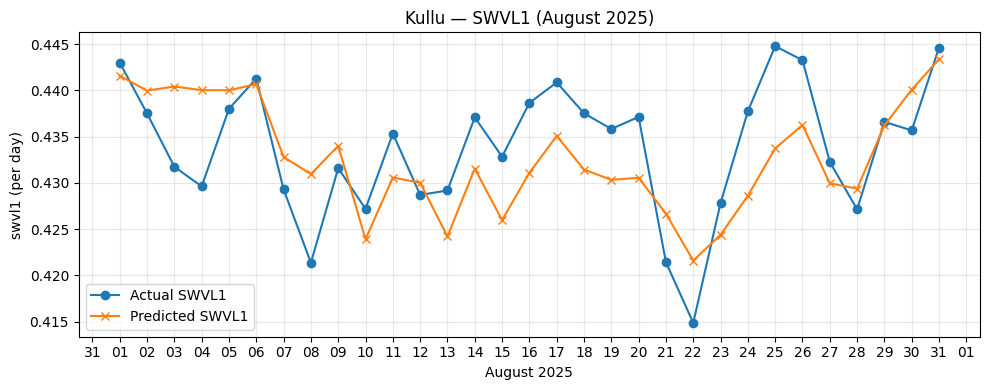

Saved: outputs/Kullu_Aug2025_swvl1_daily_sum.png


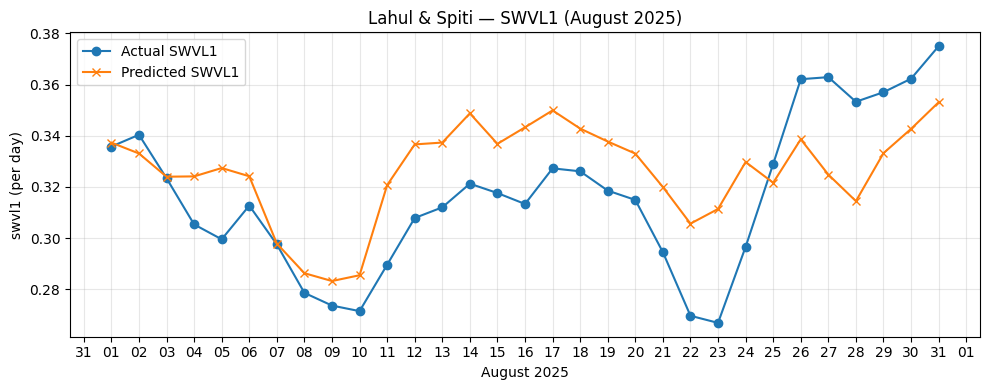

Saved: outputs/Lahul & Spiti_Aug2025_swvl1_daily_sum.png


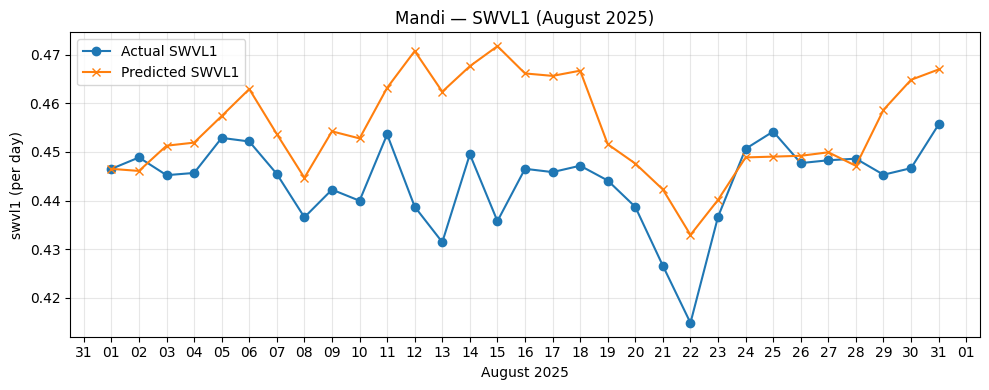

Saved: outputs/Mandi_Aug2025_swvl1_daily_sum.png


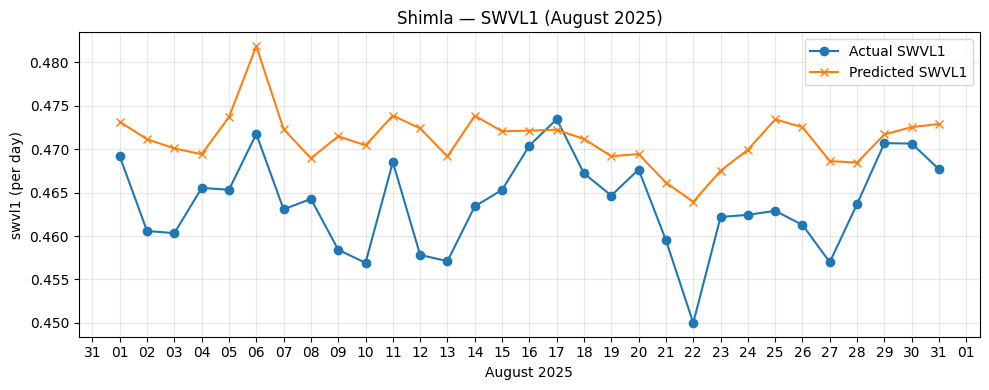

Saved: outputs/Shimla_Aug2025_swvl1_daily_sum.png


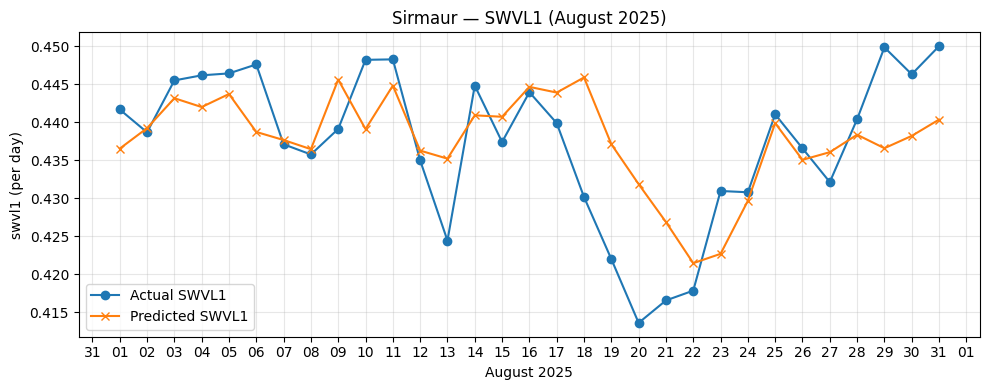

Saved: outputs/Sirmaur_Aug2025_swvl1_daily_sum.png


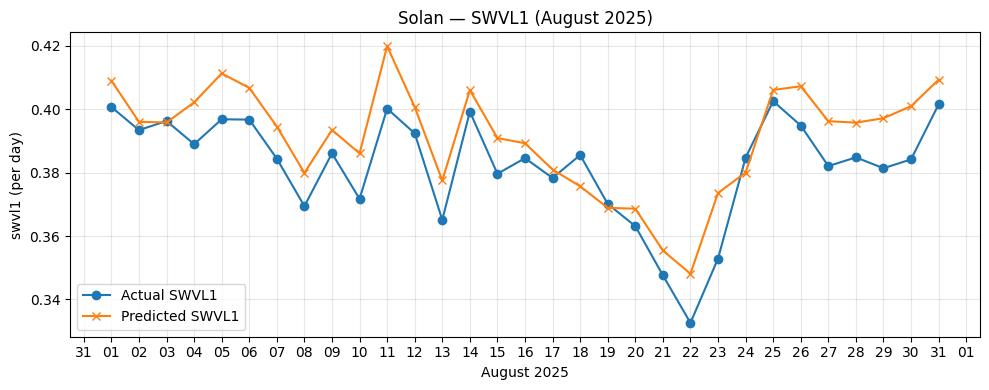

Saved: outputs/Solan_Aug2025_swvl1_daily_sum.png


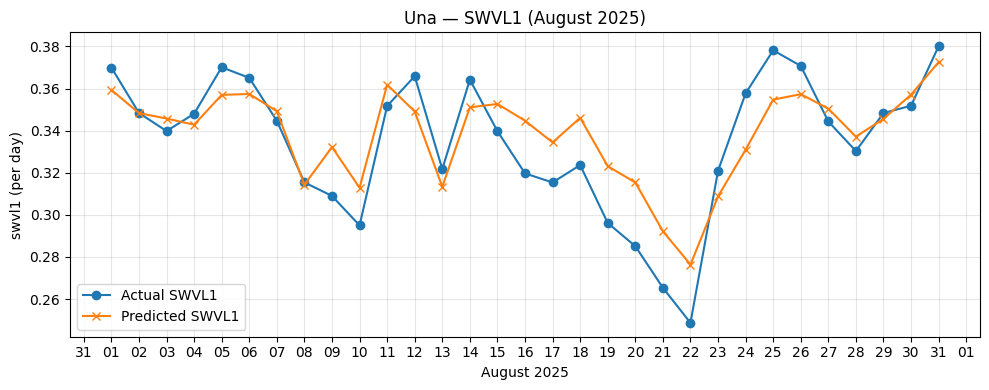

Saved: outputs/Una_Aug2025_swvl1_daily_sum.png
✅ Daily-sum plots for all districts saved to 'outputs/'


In [ ]:
import matplotlib.dates as mdates

FEATURE_TO_PLOT = "swvl1"   
feat_idx = FEATURE_COLS.index(FEATURE_TO_PLOT)

aug_mask = (full_time_index >= pd.to_datetime("2025-08-01")) & (full_time_index < pd.to_datetime("2025-09-01"))
aug_times = full_time_index[aug_mask]
aug_indices = np.where(aug_mask)[0]
print(f"Plotting daily sums for August 2025 ({len(aug_times)} hours) for '{FEATURE_TO_PLOT}'")
model.eval()
pred_series = np.zeros((num_nodes, len(aug_times)), dtype=np.float32)
true_series = data_scaled[:, aug_indices, feat_idx]

with torch.no_grad():
    for i, idx in enumerate(tqdm(aug_indices, desc="Predicting August windows")):
        if idx - PAST_SEQ < 0 or idx + HORIZON > data_scaled.shape[1]:
            continue
        x_input = data_scaled[:, idx - PAST_SEQ:idx, :]
        x_input_t = torch.tensor(x_input, dtype=torch.float32).unsqueeze(0).to(DEVICE)
        y_pred = model(x_input_t)  
        y_pred = y_pred[0, :, 0, feat_idx].cpu().numpy() 
        pred_series[:, i] = y_pred

feat_mean = scaler.mean_[feat_idx]
feat_std = scaler.scale_[feat_idx]
pred_inv = pred_series * feat_std + feat_mean
true_inv = true_series * feat_std + feat_mean
df_pred = pd.DataFrame(pred_inv.T, index=aug_times, columns=districts)
df_true = pd.DataFrame(true_inv.T, index=aug_times, columns=districts)
df_pred_daily = df_pred.resample("1D").mean()
df_true_daily = df_true.resample("1D").mean()

days = df_true_daily.index
print(f"Aggregated into {len(days)} days (daily sums).")

for d in districts:
    plt.figure(figsize=(10,4))
    plt.plot(days, df_true_daily[d], label="Actual SWVL1", marker='o')
    plt.plot(days, df_pred_daily[d], label="Predicted SWVL1", marker='x')
    plt.title(f"{d} — {FEATURE_TO_PLOT.upper()} (August 2025)")
    plt.xlabel("August 2025")
    plt.ylabel(f"{FEATURE_TO_PLOT} (per day)")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%d"))
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"{d}_Aug2025_{FEATURE_TO_PLOT}_daily_sum.png")
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")

print(f"✅ Daily-sum plots for all districts saved to '{OUTPUT_DIR}/'")


## SWVL2 (August)

Plotting daily sums for August 2025 (744 hours) for 'swvl2'


Predicting August windows: 100%|██████████| 744/744 [00:00<00:00, 1059.80it/s]


Aggregated into 31 days (daily sums).


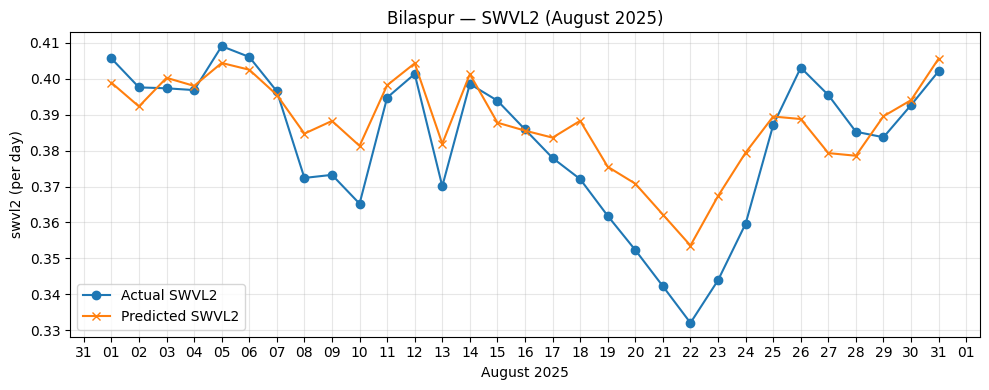

Saved: outputs/Bilaspur_Aug2025_swvl2_daily_sum.png


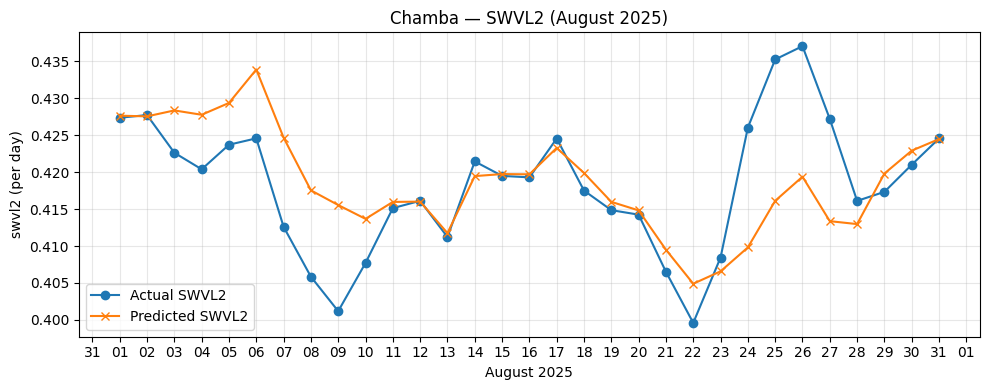

Saved: outputs/Chamba_Aug2025_swvl2_daily_sum.png


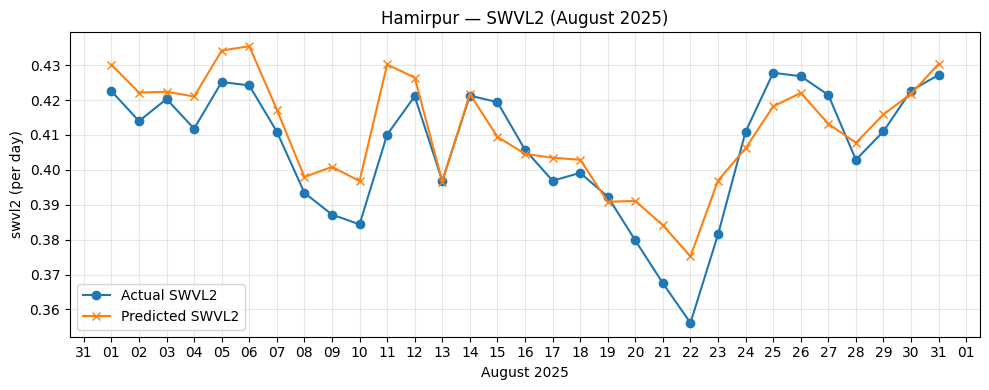

Saved: outputs/Hamirpur_Aug2025_swvl2_daily_sum.png


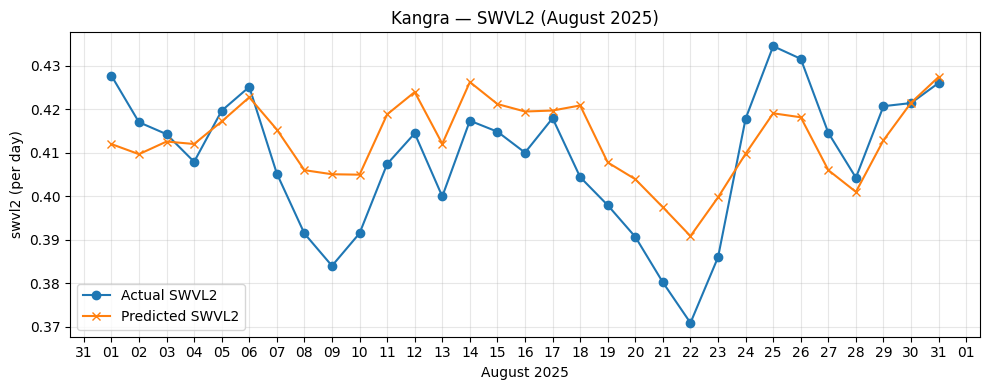

Saved: outputs/Kangra_Aug2025_swvl2_daily_sum.png


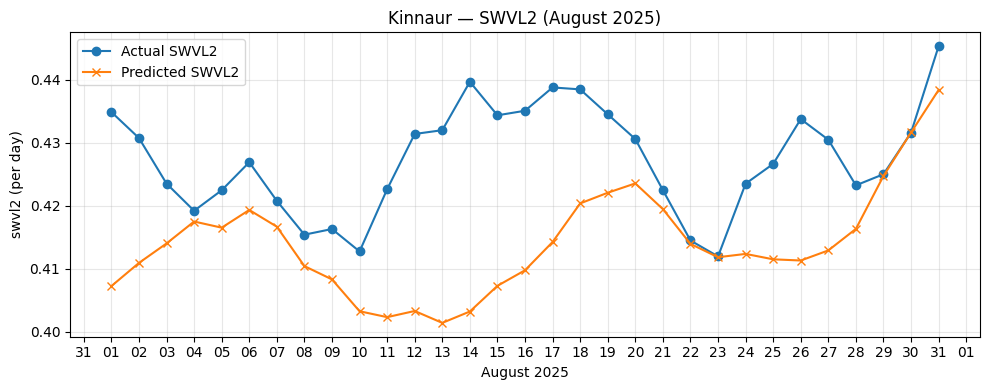

Saved: outputs/Kinnaur_Aug2025_swvl2_daily_sum.png


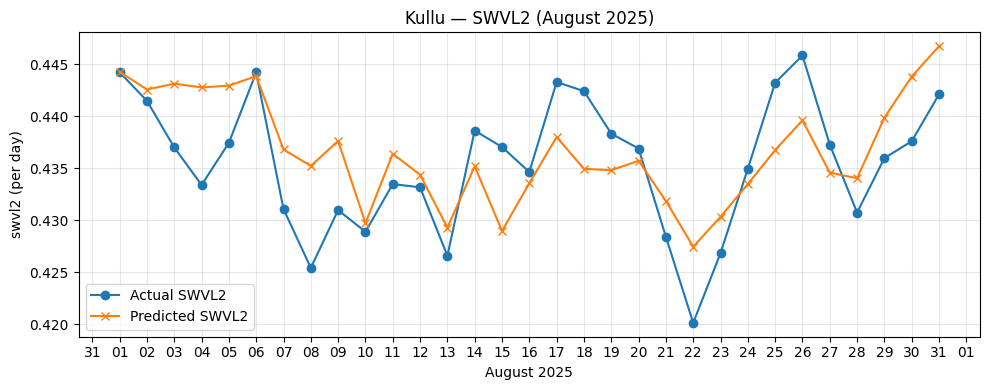

Saved: outputs/Kullu_Aug2025_swvl2_daily_sum.png


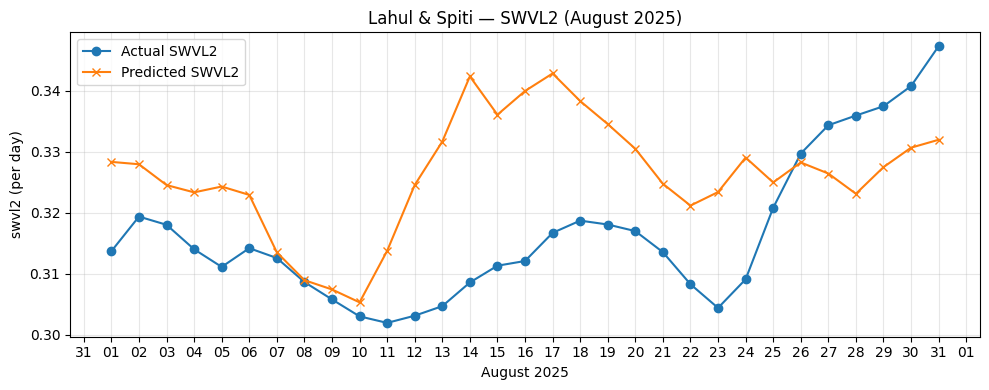

Saved: outputs/Lahul & Spiti_Aug2025_swvl2_daily_sum.png


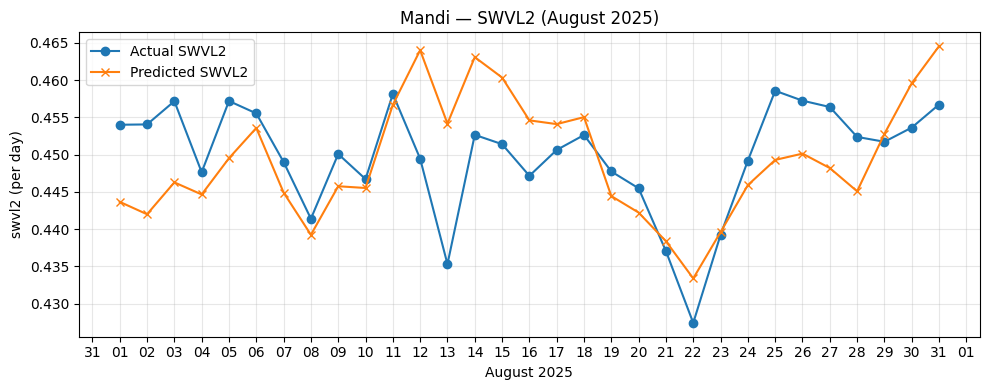

Saved: outputs/Mandi_Aug2025_swvl2_daily_sum.png


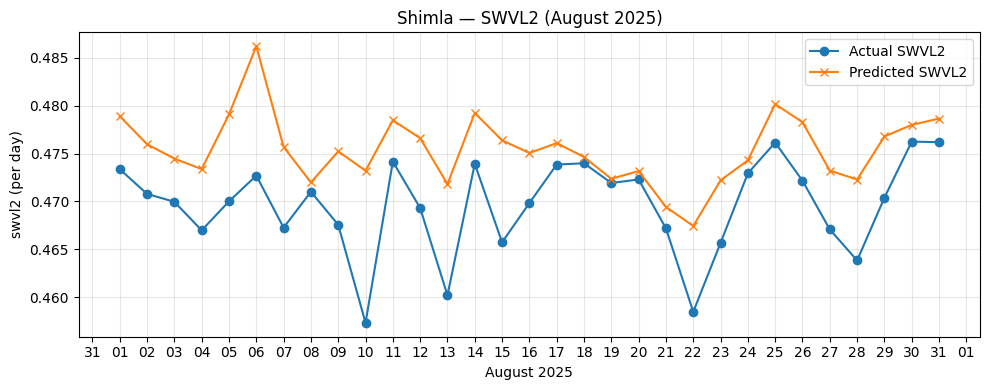

Saved: outputs/Shimla_Aug2025_swvl2_daily_sum.png


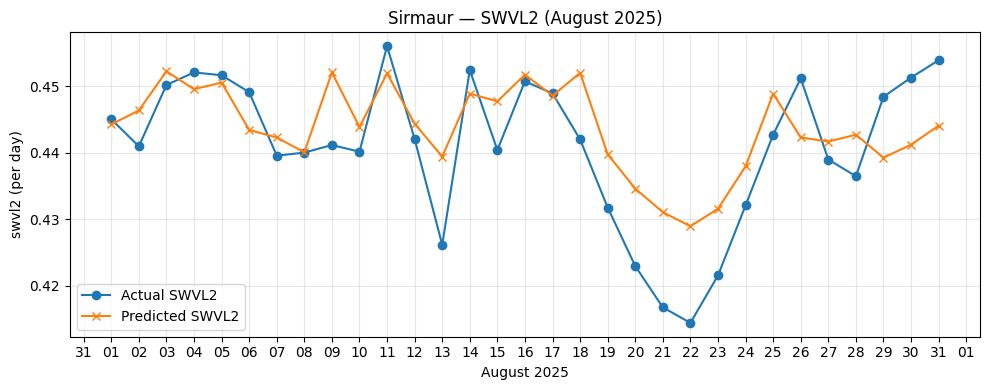

Saved: outputs/Sirmaur_Aug2025_swvl2_daily_sum.png


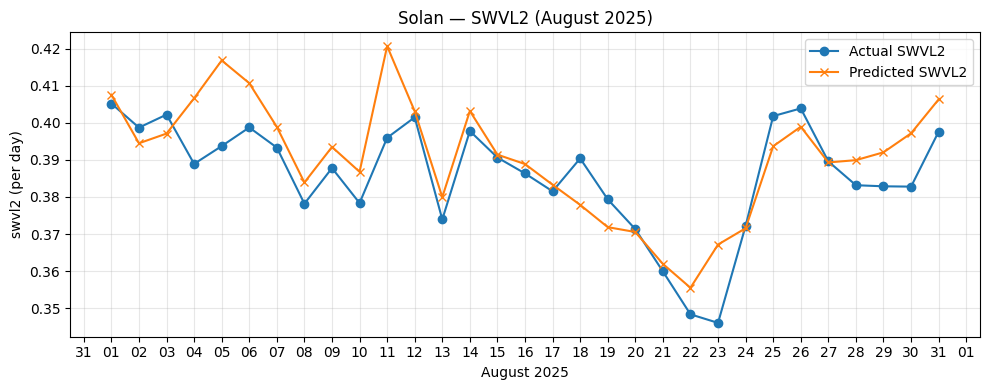

Saved: outputs/Solan_Aug2025_swvl2_daily_sum.png


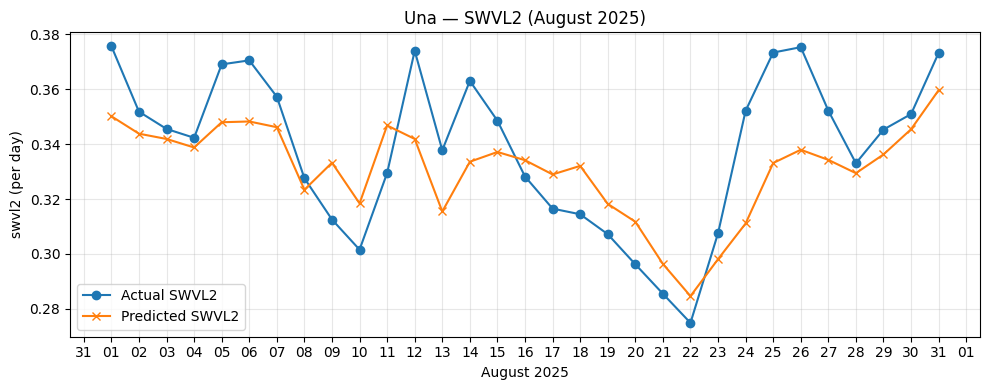

Saved: outputs/Una_Aug2025_swvl2_daily_sum.png
✅ Daily-sum plots for all districts saved to 'outputs/'


In [ ]:
import matplotlib.dates as mdates

FEATURE_TO_PLOT = "swvl2"  
feat_idx = FEATURE_COLS.index(FEATURE_TO_PLOT)

aug_mask = (full_time_index >= pd.to_datetime("2025-08-01")) & (full_time_index < pd.to_datetime("2025-09-01"))
aug_times = full_time_index[aug_mask]
aug_indices = np.where(aug_mask)[0]
print(f"Plotting daily sums for August 2025 ({len(aug_times)} hours) for '{FEATURE_TO_PLOT}'")

model.eval()
pred_series = np.zeros((num_nodes, len(aug_times)), dtype=np.float32)
true_series = data_scaled[:, aug_indices, feat_idx]

with torch.no_grad():
    for i, idx in enumerate(tqdm(aug_indices, desc="Predicting August windows")):
        if idx - PAST_SEQ < 0 or idx + HORIZON > data_scaled.shape[1]:
            continue
        x_input = data_scaled[:, idx - PAST_SEQ:idx, :]
        x_input_t = torch.tensor(x_input, dtype=torch.float32).unsqueeze(0).to(DEVICE)
        y_pred = model(x_input_t)  
        y_pred = y_pred[0, :, 0, feat_idx].cpu().numpy() 
        pred_series[:, i] = y_pred
feat_mean = scaler.mean_[feat_idx]
feat_std = scaler.scale_[feat_idx]
pred_inv = pred_series * feat_std + feat_mean
true_inv = true_series * feat_std + feat_mean
df_pred = pd.DataFrame(pred_inv.T, index=aug_times, columns=districts)
df_true = pd.DataFrame(true_inv.T, index=aug_times, columns=districts)
df_pred_daily = df_pred.resample("1D").mean()
df_true_daily = df_true.resample("1D").mean()

days = df_true_daily.index
print(f"Aggregated into {len(days)} days (daily sums).")
districts1=["Bilaspur"]
for d in districts:
    plt.figure(figsize=(10,4))
    plt.plot(days, df_true_daily[d], label="Actual SWVL2", marker='o')
    plt.plot(days, df_pred_daily[d], label="Predicted SWVL2", marker='x')
    plt.title(f"{d} — {FEATURE_TO_PLOT.upper()} (August 2025)")
    plt.xlabel("August 2025")
    plt.ylabel(f"{FEATURE_TO_PLOT} (per day)")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%d"))
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"{d}_Aug2025_{FEATURE_TO_PLOT}_daily_sum.png")
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")

print(f"✅ Daily-sum plots for all districts saved to '{OUTPUT_DIR}/'")


## SWVL3 (August)

Plotting daily sums for August 2025 (744 hours) for 'swvl3'


Predicting August windows: 100%|██████████| 744/744 [00:00<00:00, 1038.54it/s]


Aggregated into 31 days (daily sums).


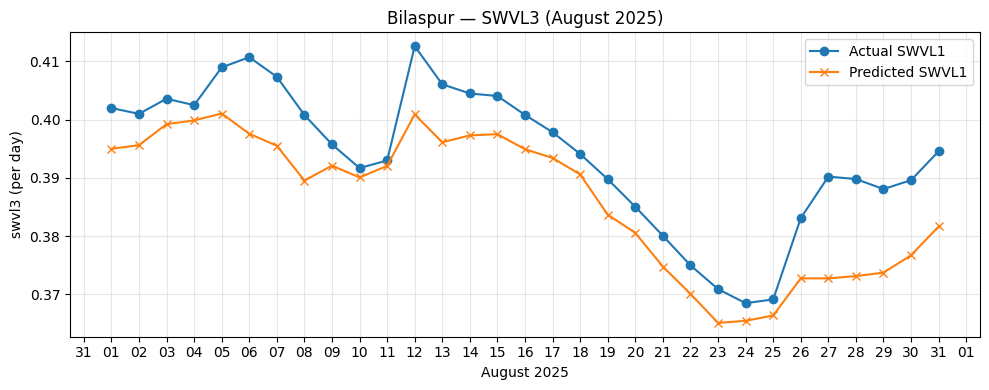

Saved: outputs/Bilaspur_Aug2025_swvl3_daily_sum.png


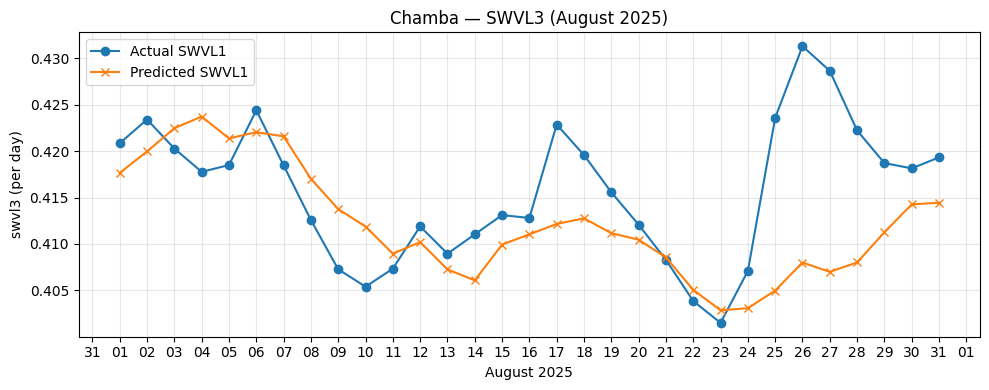

Saved: outputs/Chamba_Aug2025_swvl3_daily_sum.png


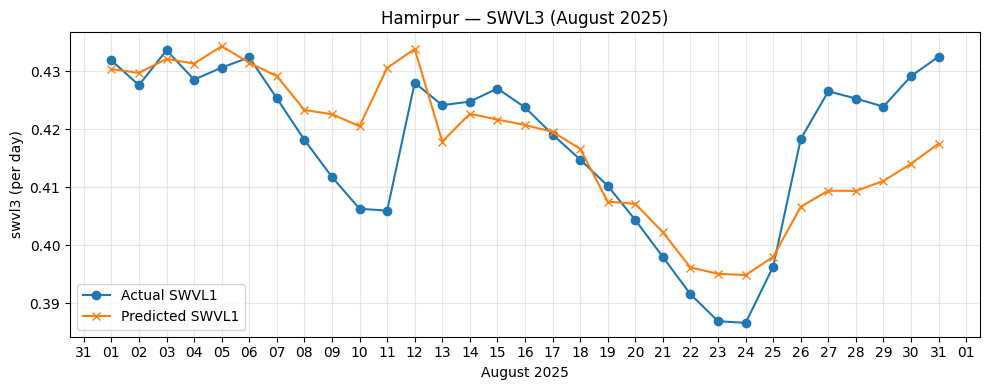

Saved: outputs/Hamirpur_Aug2025_swvl3_daily_sum.png


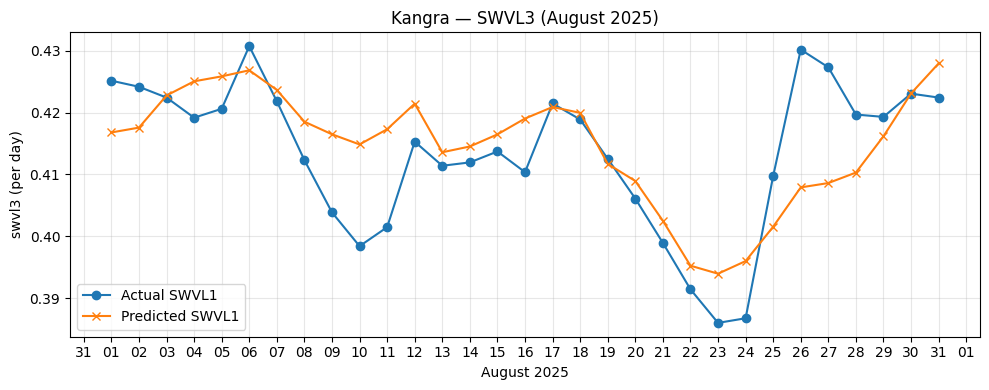

Saved: outputs/Kangra_Aug2025_swvl3_daily_sum.png


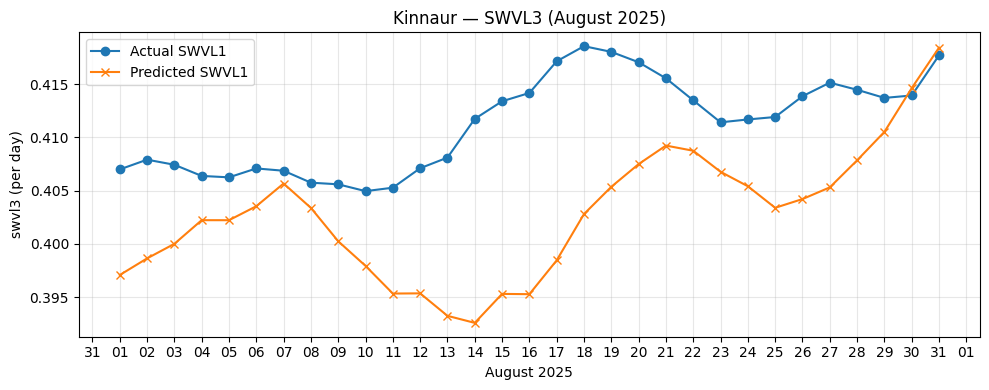

Saved: outputs/Kinnaur_Aug2025_swvl3_daily_sum.png


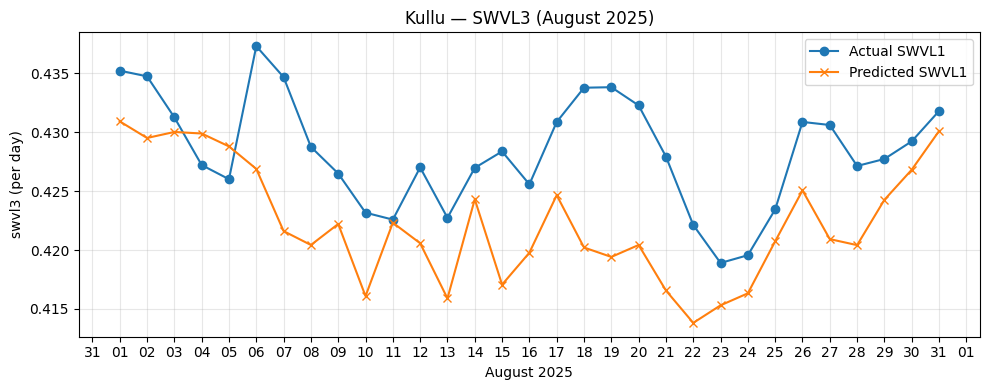

Saved: outputs/Kullu_Aug2025_swvl3_daily_sum.png


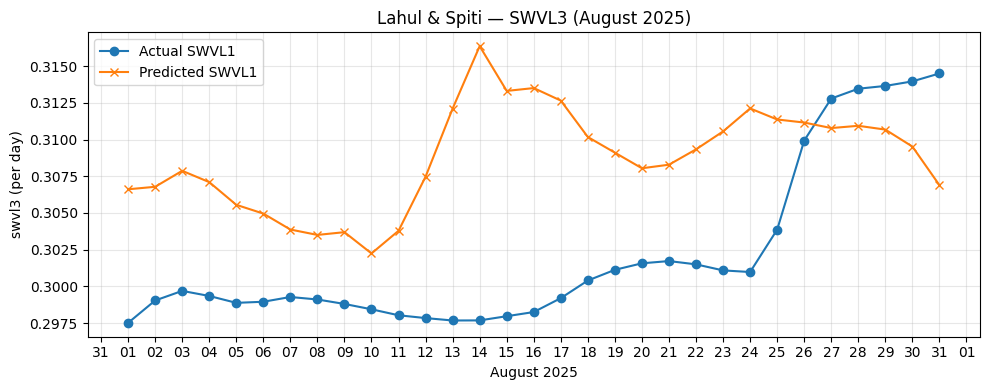

Saved: outputs/Lahul & Spiti_Aug2025_swvl3_daily_sum.png


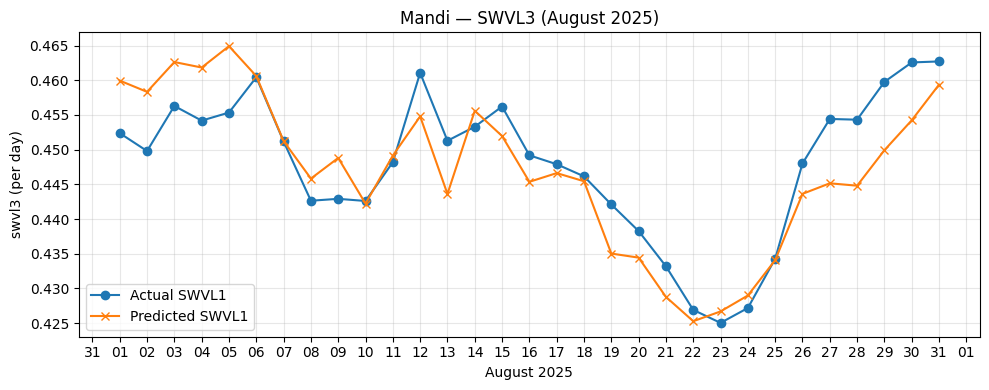

Saved: outputs/Mandi_Aug2025_swvl3_daily_sum.png


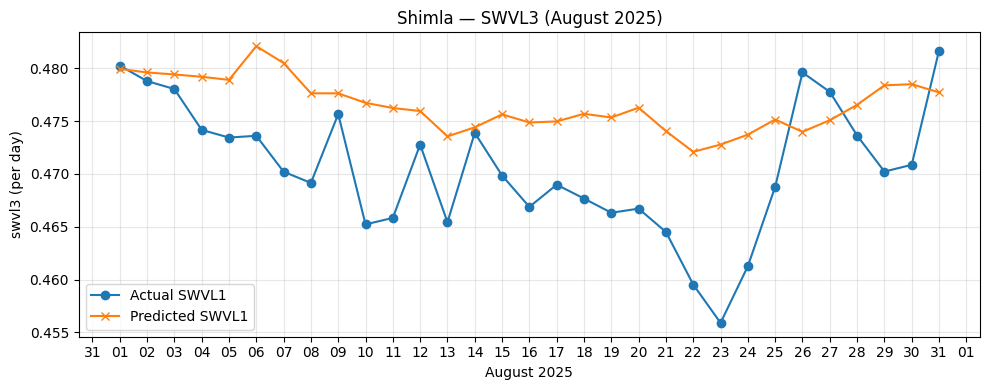

Saved: outputs/Shimla_Aug2025_swvl3_daily_sum.png


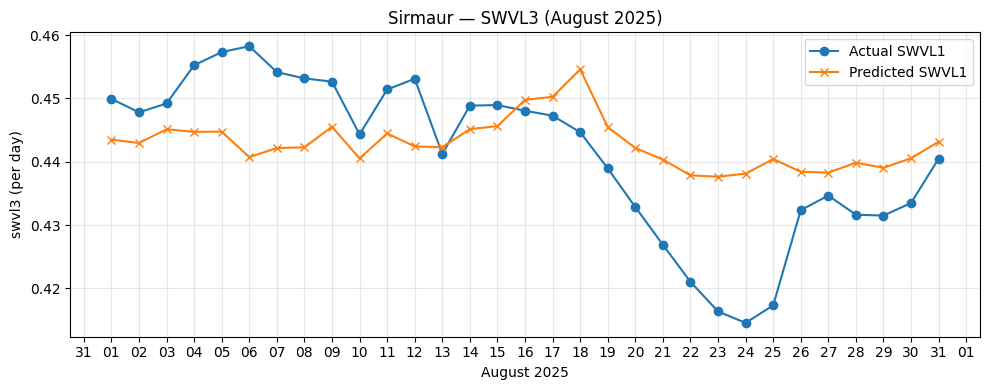

Saved: outputs/Sirmaur_Aug2025_swvl3_daily_sum.png


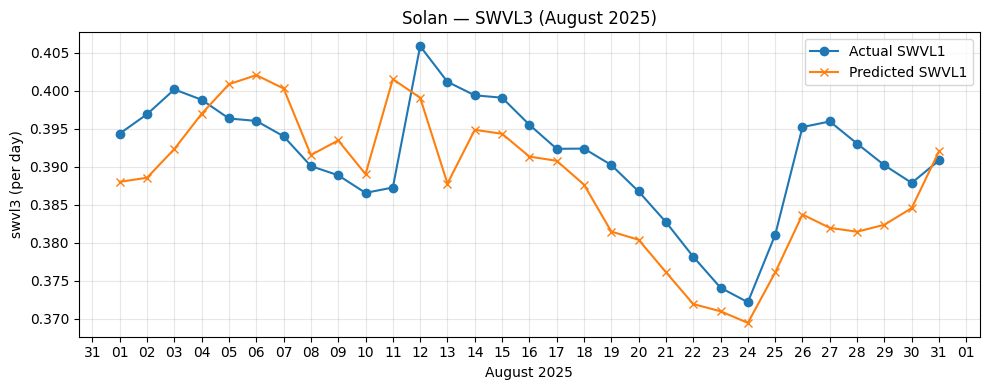

Saved: outputs/Solan_Aug2025_swvl3_daily_sum.png


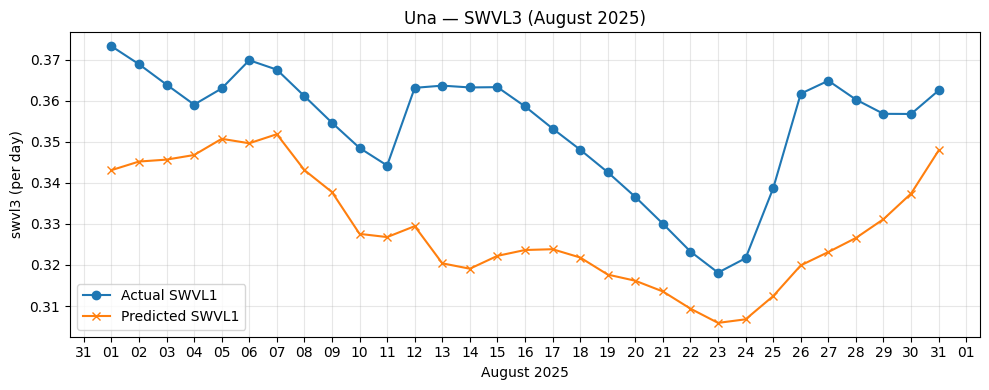

Saved: outputs/Una_Aug2025_swvl3_daily_sum.png
✅ Daily-sum plots for all districts saved to 'outputs/'


In [ ]:
import matplotlib.dates as mdates

FEATURE_TO_PLOT = "swvl3"  
feat_idx = FEATURE_COLS.index(FEATURE_TO_PLOT)

aug_mask = (full_time_index >= pd.to_datetime("2025-08-01")) & (full_time_index < pd.to_datetime("2025-09-01"))
aug_times = full_time_index[aug_mask]
aug_indices = np.where(aug_mask)[0]
print(f"Plotting daily sums for August 2025 ({len(aug_times)} hours) for '{FEATURE_TO_PLOT}'")
model.eval()
pred_series = np.zeros((num_nodes, len(aug_times)), dtype=np.float32)
true_series = data_scaled[:, aug_indices, feat_idx]

with torch.no_grad():
    for i, idx in enumerate(tqdm(aug_indices, desc="Predicting August windows")):
        if idx - PAST_SEQ < 0 or idx + HORIZON > data_scaled.shape[1]:
            continue
        x_input = data_scaled[:, idx - PAST_SEQ:idx, :] 
        x_input_t = torch.tensor(x_input, dtype=torch.float32).unsqueeze(0).to(DEVICE)
        y_pred = model(x_input_t)
        y_pred = y_pred[0, :, 0, feat_idx].cpu().numpy()
        pred_series[:, i] = y_pred

feat_mean = scaler.mean_[feat_idx]
feat_std = scaler.scale_[feat_idx]
pred_inv = pred_series * feat_std + feat_mean
true_inv = true_series * feat_std + feat_mean
df_pred = pd.DataFrame(pred_inv.T, index=aug_times, columns=districts)
df_true = pd.DataFrame(true_inv.T, index=aug_times, columns=districts)
df_pred_daily = df_pred.resample("1D").mean()
df_true_daily = df_true.resample("1D").mean()

days = df_true_daily.index
print(f"Aggregated into {len(days)} days (daily sums).")

for d in districts:
    plt.figure(figsize=(10,4))
    plt.plot(days, df_true_daily[d], label="Actual SWVL1", marker='o')
    plt.plot(days, df_pred_daily[d], label="Predicted SWVL1", marker='x')
    plt.title(f"{d} — {FEATURE_TO_PLOT.upper()} (August 2025)")
    plt.xlabel("August 2025")
    plt.ylabel(f"{FEATURE_TO_PLOT} (per day)")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%d"))
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"{d}_Aug2025_{FEATURE_TO_PLOT}_daily_sum.png")
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")

print(f"✅ Daily-sum plots for all districts saved to '{OUTPUT_DIR}/'")


## T2m (August)

Plotting August 2025 (744 hours) for feature 't2m'


Predicting August windows: 100%|██████████| 744/744 [00:00<00:00, 1032.33it/s]


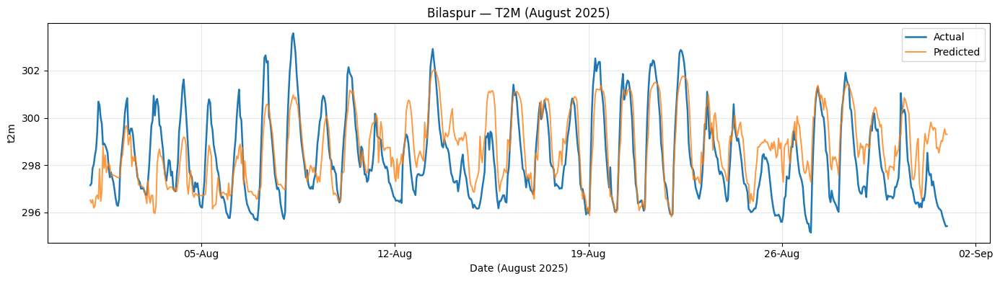

Saved: outputs/Bilaspur_Aug2025_t2m_timeseries.png


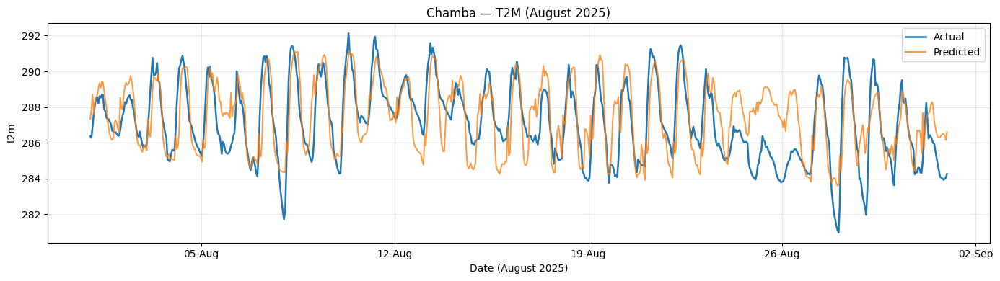

Saved: outputs/Chamba_Aug2025_t2m_timeseries.png


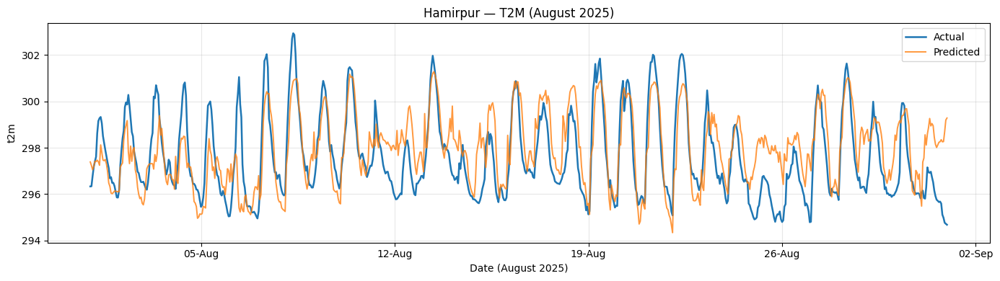

Saved: outputs/Hamirpur_Aug2025_t2m_timeseries.png


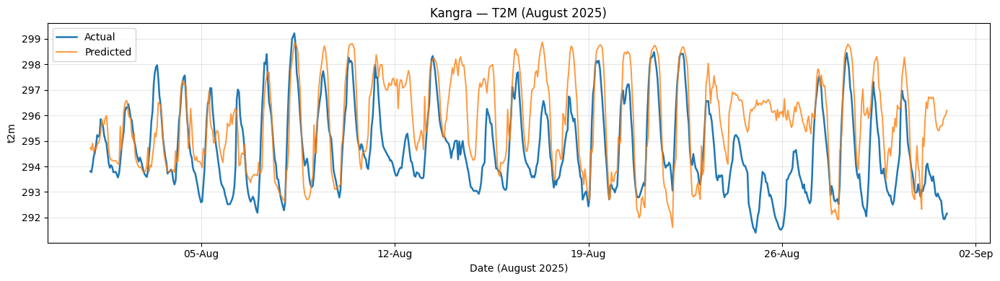

Saved: outputs/Kangra_Aug2025_t2m_timeseries.png


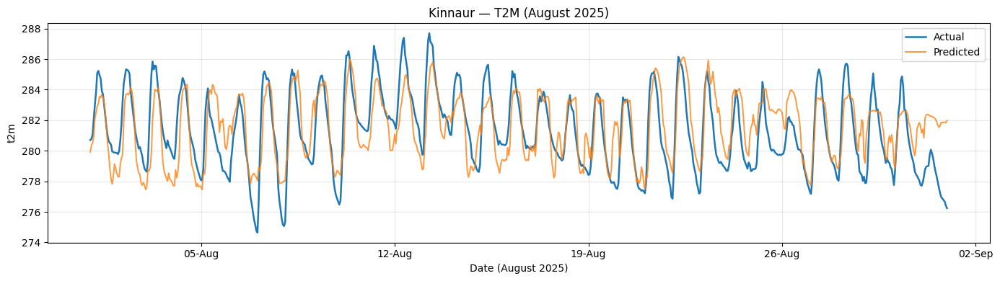

Saved: outputs/Kinnaur_Aug2025_t2m_timeseries.png


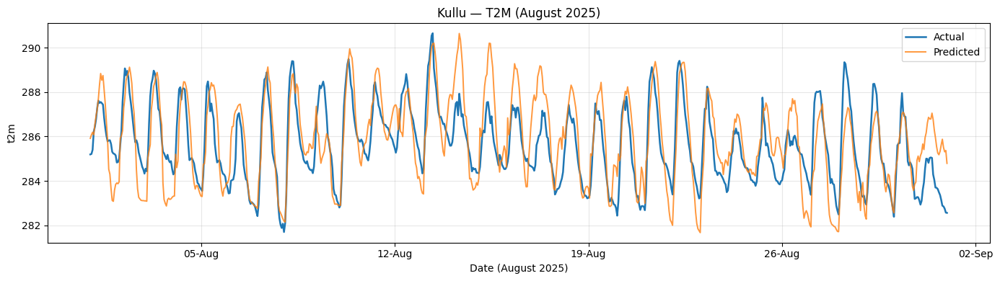

Saved: outputs/Kullu_Aug2025_t2m_timeseries.png


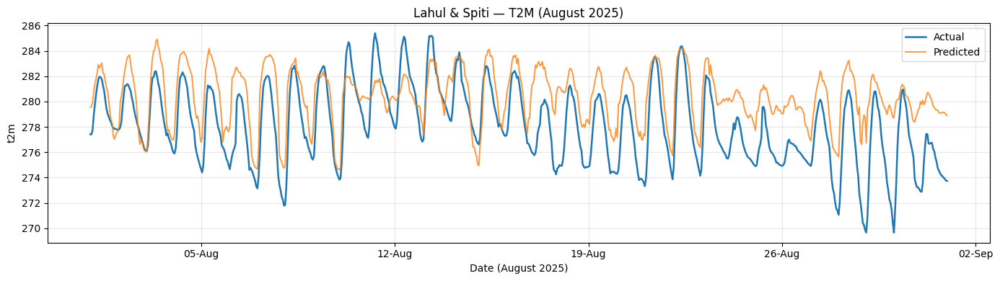

Saved: outputs/Lahul & Spiti_Aug2025_t2m_timeseries.png


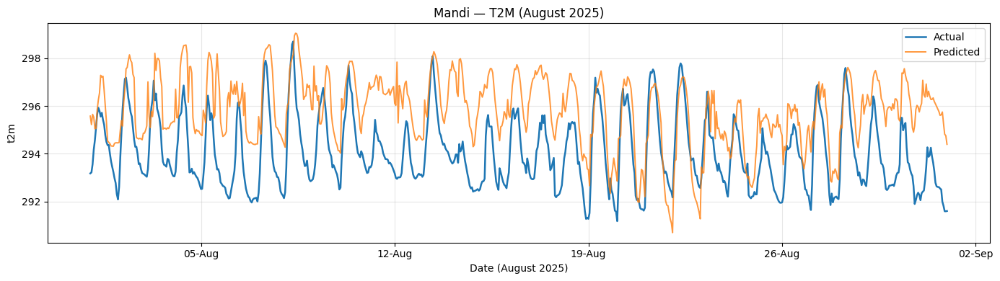

Saved: outputs/Mandi_Aug2025_t2m_timeseries.png


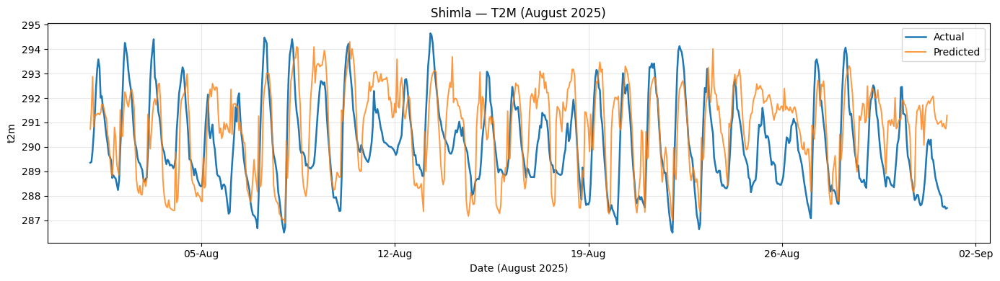

Saved: outputs/Shimla_Aug2025_t2m_timeseries.png


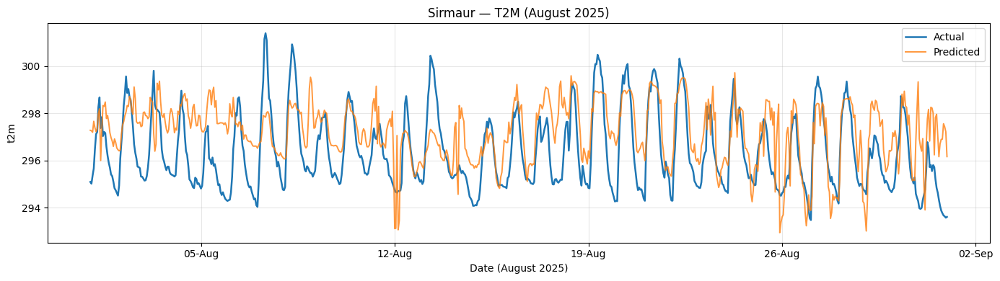

Saved: outputs/Sirmaur_Aug2025_t2m_timeseries.png


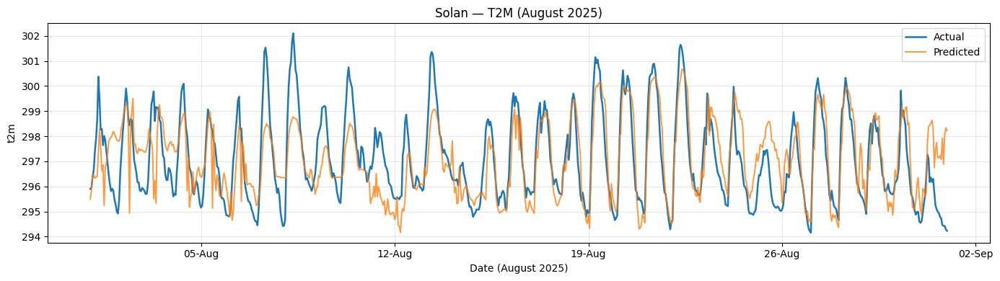

Saved: outputs/Solan_Aug2025_t2m_timeseries.png


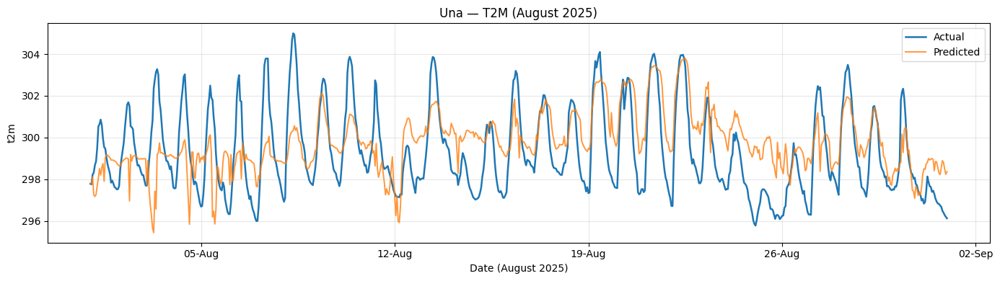

Saved: outputs/Una_Aug2025_t2m_timeseries.png
✅ All district plots for t2m (August 2025) saved in 'outputs/'


In [ ]:
import matplotlib.dates as mdates

FEATURE_TO_PLOT = "t2m" 
feat_idx = FEATURE_COLS.index(FEATURE_TO_PLOT)

aug_mask = (full_time_index >= pd.to_datetime("2025-08-01")) & (full_time_index < pd.to_datetime("2025-09-01"))
aug_times = full_time_index[aug_mask]
aug_indices = np.where(aug_mask)[0]
print(f"Plotting August 2025 ({len(aug_times)} hours) for feature '{FEATURE_TO_PLOT}'")
model.eval()
pred_series = np.zeros((num_nodes, len(aug_times)), dtype=np.float32)
true_series = data_scaled[:, aug_indices, feat_idx] 

with torch.no_grad():
    for i, idx in enumerate(tqdm(aug_indices, desc="Predicting August windows")):
        if idx - PAST_SEQ < 0 or idx + HORIZON > data_scaled.shape[1]:
            continue
        x_input = data_scaled[:, idx - PAST_SEQ:idx, :] 
        x_input_t = torch.tensor(x_input, dtype=torch.float32).unsqueeze(0).to(DEVICE)
        y_pred = model(x_input_t) 
        y_pred = y_pred[0, :, 0, feat_idx].cpu().numpy() 
        pred_series[:, i] = y_pred

scaled_example = np.zeros((1, len(FEATURE_COLS)))
feat_mean = scaler.mean_[feat_idx]
feat_std = scaler.scale_[feat_idx]
pred_inv = pred_series * feat_std + feat_mean
true_inv = true_series * feat_std + feat_mean

for d_idx, district_name in enumerate(districts):
    plt.figure(figsize=(14, 4))
    plt.plot(aug_times, true_inv[d_idx], label="Actual", linewidth=1.8)
    plt.plot(aug_times, pred_inv[d_idx], label="Predicted", linewidth=1.4, alpha=0.8)
    plt.title(f"{district_name} — {FEATURE_TO_PLOT.upper()} (August 2025)")
    plt.xlabel("Date (August 2025)")
    plt.ylabel(FEATURE_TO_PLOT)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"{district_name}_Aug2025_{FEATURE_TO_PLOT}_timeseries.png")
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")

print(f"✅ All district plots for {FEATURE_TO_PLOT} (August 2025) saved in '{OUTPUT_DIR}/'")


## D2m (August)

Plotting August 2025 (744 hours) for feature 'd2m'


Predicting August windows: 100%|██████████| 744/744 [00:00<00:00, 993.87it/s] 


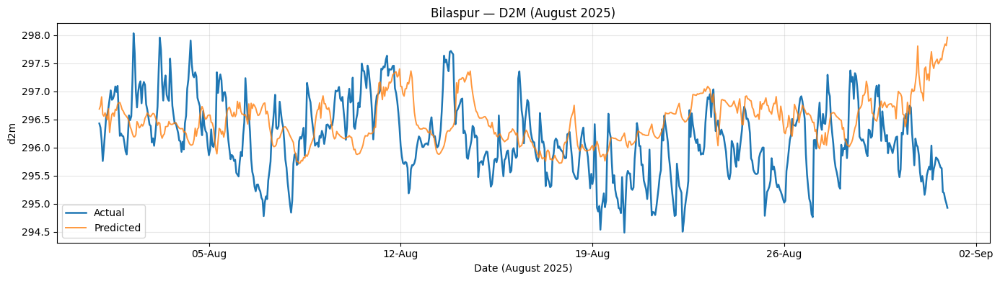

Saved: outputs/Bilaspur_Aug2025_d2m_timeseries.png


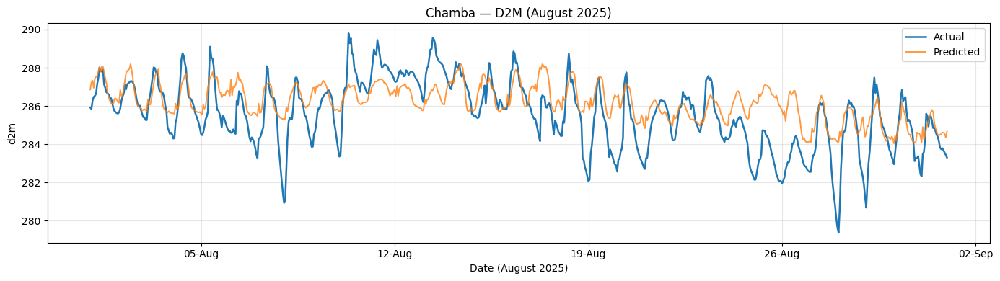

Saved: outputs/Chamba_Aug2025_d2m_timeseries.png


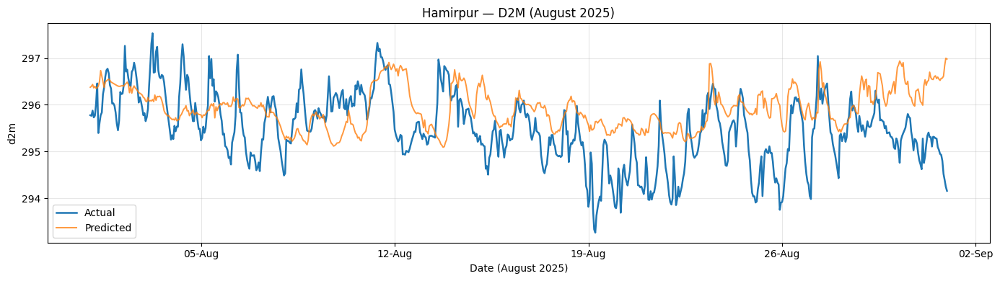

Saved: outputs/Hamirpur_Aug2025_d2m_timeseries.png


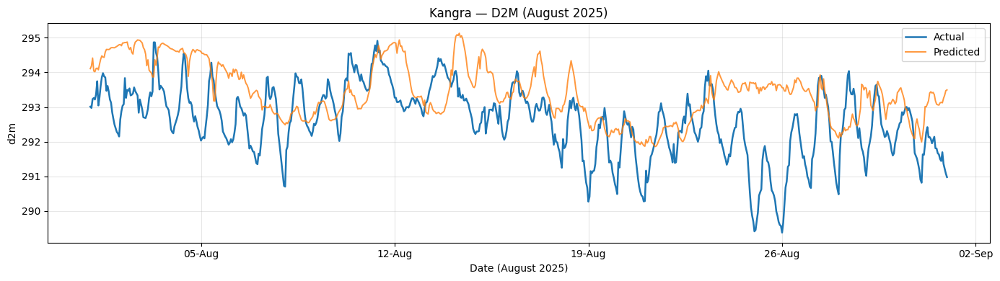

Saved: outputs/Kangra_Aug2025_d2m_timeseries.png


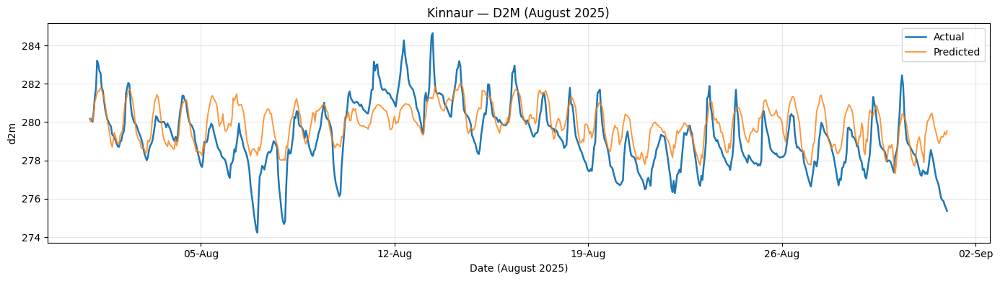

Saved: outputs/Kinnaur_Aug2025_d2m_timeseries.png


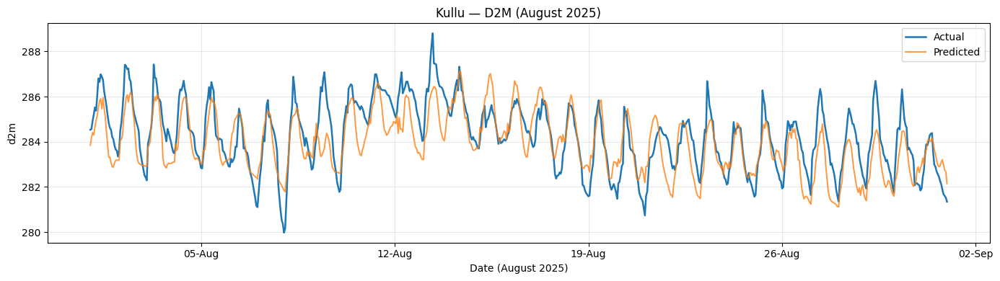

Saved: outputs/Kullu_Aug2025_d2m_timeseries.png


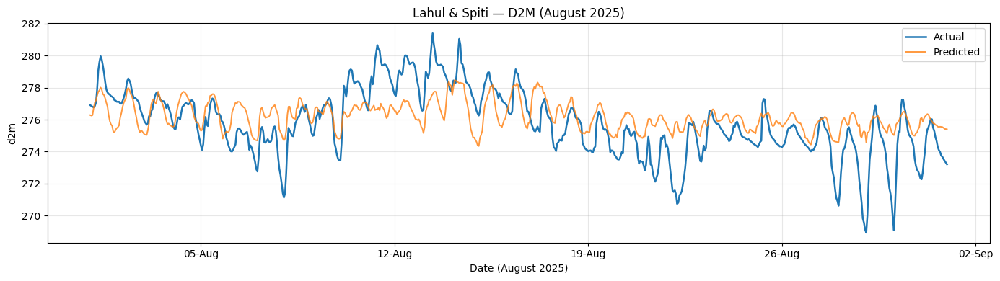

Saved: outputs/Lahul & Spiti_Aug2025_d2m_timeseries.png


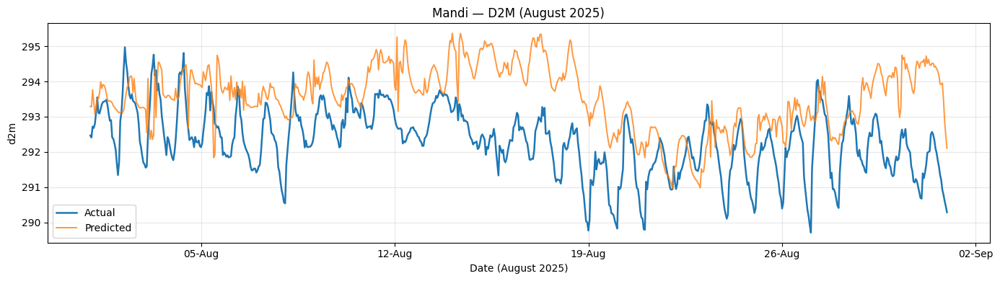

Saved: outputs/Mandi_Aug2025_d2m_timeseries.png


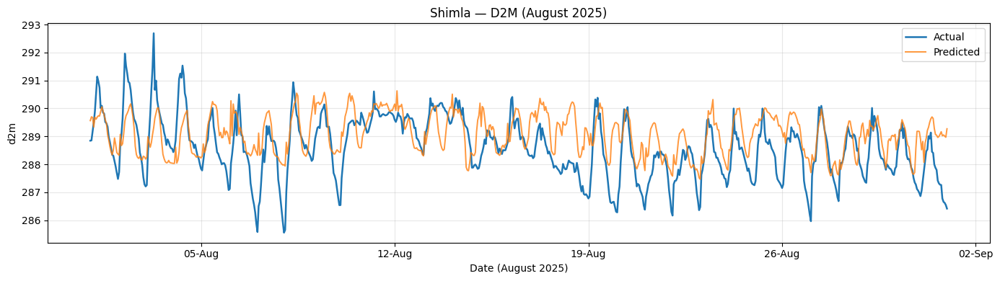

Saved: outputs/Shimla_Aug2025_d2m_timeseries.png


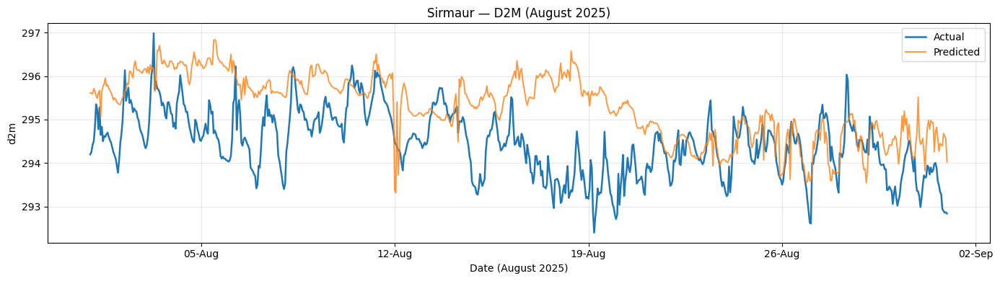

Saved: outputs/Sirmaur_Aug2025_d2m_timeseries.png


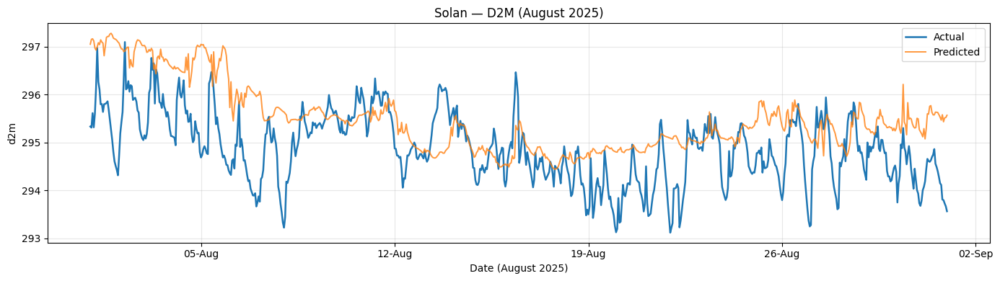

Saved: outputs/Solan_Aug2025_d2m_timeseries.png


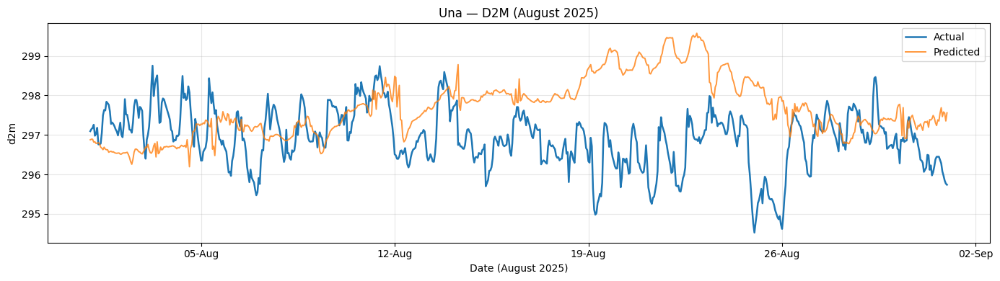

Saved: outputs/Una_Aug2025_d2m_timeseries.png
✅ All district plots for d2m (August 2025) saved in 'outputs/'


In [ ]:
import matplotlib.dates as mdates
FEATURE_TO_PLOT = "d2m" 
feat_idx = FEATURE_COLS.index(FEATURE_TO_PLOT)

aug_mask = (full_time_index >= pd.to_datetime("2025-08-01")) & (full_time_index < pd.to_datetime("2025-09-01"))
aug_times = full_time_index[aug_mask]
aug_indices = np.where(aug_mask)[0]
print(f"Plotting August 2025 ({len(aug_times)} hours) for feature '{FEATURE_TO_PLOT}'")

model.eval()
pred_series = np.zeros((num_nodes, len(aug_times)), dtype=np.float32)
true_series = data_scaled[:, aug_indices, feat_idx] 

with torch.no_grad():
    for i, idx in enumerate(tqdm(aug_indices, desc="Predicting August windows")):
        if idx - PAST_SEQ < 0 or idx + HORIZON > data_scaled.shape[1]:
            continue
        x_input = data_scaled[:, idx - PAST_SEQ:idx, :] 
        x_input_t = torch.tensor(x_input, dtype=torch.float32).unsqueeze(0).to(DEVICE)
        y_pred = model(x_input_t) 
        y_pred = y_pred[0, :, 0, feat_idx].cpu().numpy() 
        pred_series[:, i] = y_pred

scaled_example = np.zeros((1, len(FEATURE_COLS)))
feat_mean = scaler.mean_[feat_idx]
feat_std = scaler.scale_[feat_idx]
pred_inv = pred_series * feat_std + feat_mean
true_inv = true_series * feat_std + feat_mean

for d_idx, district_name in enumerate(districts):
    plt.figure(figsize=(14, 4))
    plt.plot(aug_times, true_inv[d_idx], label="Actual", linewidth=1.8)
    plt.plot(aug_times, pred_inv[d_idx], label="Predicted", linewidth=1.4, alpha=0.8)
    plt.title(f"{district_name} — {FEATURE_TO_PLOT.upper()} (August 2025)")
    plt.xlabel("Date (August 2025)")
    plt.ylabel(FEATURE_TO_PLOT)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    plt.tight_layout()
    out_path = os.path.join(OUTPUT_DIR, f"{district_name}_Aug2025_{FEATURE_TO_PLOT}_timeseries.png")
    plt.savefig(out_path, dpi=200)
    plt.show()
    print(f"Saved: {out_path}")

print(f"✅ All district plots for {FEATURE_TO_PLOT} (August 2025) saved in '{OUTPUT_DIR}/'")
